### Importing Libraries

In [40]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px

from geopy.geocoders import Nominatim
# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
from folium.plugins import FloatImage
import folium # plotting library

import matplotlib.pyplot as plt
import seaborn as sns

# Plotly
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
init_notebook_mode(connected=True)
%matplotlib inline

In [2]:
# Import the dataset into a DataFrame
df = pd.read_csv("Swiggy_dataset.csv")


In [3]:
df.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,costForTwoStrings,deliveryTime,minDeliveryTime,maxDeliveryTime,address,locality,unserviceable,veg,City
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,₹200 FOR TWO,44,44,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False,NaN
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],₹350 FOR TWO,33,33,33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False,NaN
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],₹200 FOR TWO,28,28,28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True,NaN
3,F,328315,HIIT Meals,81ab4019-2445-4aef-aff2-04beccd641d9,Ahmedabad,Vishala,--,Too Few Ratings,['Fast Food' 'Combo' 'Snacks' 'North Indian' '...,₹150 FOR TWO,51,51,51,C11 Rajyash Rise Near Vishala Restaurant Vasna...,Vasna,False,False,NaN
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],₹250 FOR TWO,29,29,29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True,NaN


In [4]:
# Check for missing data
print(df.isnull().sum())

type                     0
id                       0
name                     0
uuid                     3
city                     0
area                     0
avgRating                0
totalRatingsString       0
cuisines                 0
costForTwoStrings        0
deliveryTime             0
minDeliveryTime          0
maxDeliveryTime          0
address                  9
locality                10
unserviceable            6
veg                      6
City                  8691
dtype: int64


In [5]:
# drop the "City" column from the DataFrame
df.drop(columns=["City"], inplace=True)

In [6]:
# print the first few rows of the DataFrame to check if the column was dropped
df.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,costForTwoStrings,deliveryTime,minDeliveryTime,maxDeliveryTime,address,locality,unserviceable,veg
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,₹200 FOR TWO,44,44,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],₹350 FOR TWO,33,33,33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],₹200 FOR TWO,28,28,28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True
3,F,328315,HIIT Meals,81ab4019-2445-4aef-aff2-04beccd641d9,Ahmedabad,Vishala,--,Too Few Ratings,['Fast Food' 'Combo' 'Snacks' 'North Indian' '...,₹150 FOR TWO,51,51,51,C11 Rajyash Rise Near Vishala Restaurant Vasna...,Vasna,False,False
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],₹250 FOR TWO,29,29,29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True


In [7]:
df.describe()

,id,deliveryTime,minDeliveryTime,maxDeliveryTime
count,8691.000000,8691.000000,8691.000000,8691.000000
mean,244855.957887,53.959268,53.130480,53.130480
std,158650.520513,14.290555,13.701142,13.701142
min,211.000000,20.000000,20.000000,20.000000
25%,72885.500000,44.000000,44.000000,44.000000
50%,283560.000000,52.000000,52.000000,52.000000
75%,393448.500000,64.000000,63.000000,63.000000
max,466928.000000,109.000000,109.000000,109.000000


### Data Cleaning

In [8]:
# print the unique values in the "City" column
print(df["city"].unique())

['Ahmedabad' 'Bangalore' 'Chennai' 'Delhi' 'Hyderabad' 'Kolkata' 'Mumbai'
 'Pune' 'Surat']


In [9]:
# find the rows with missing values in the "locality" column
missing_rows = df[df['locality'].isnull()]

# print the "address" column for the rows with missing values in the "locality" column
print(missing_rows["address"])

30      B-17 Neha park society Near Bileshwar  mahadev...
310     11 devbhumi complex complex commerce six road ...
2087    No 1/3 Mahaveer Colony EvK sampath  Road Chenn...
3269    E-1/11/41 SECTOR-15 ROHINI DELHI 110089,Rohini...
4617    9/10 KOLKATA JETTY  OPP TO SBI HQ EAST STRAND ...
6552    Near R Odeon Mall Next To Odeon Cinemax R.Nort...
7176    Shop No.4AParshwanath Residency Opp Prestige P...
7225    Shop 1 Rohan Chamber Near S.P. College Off Til...
7354    667  First Floor  Taboot Street   Next To Huss...
8500    G-77 Time Trade Center (TTC)Opposite  Polaris ...
Name: address, dtype: object


In [10]:
#print the number of columns where the value of "avgRating" is "--"
print('Number of columns with "--" value in avgRating:')
print(df.loc[df["avgRating"] == "--", "avgRating"].count())

Number of columns with "--" value in avgRating:
3279


In [11]:
# find the number of columns where the value of avgRating is "--"
df["avgRating"] = df["avgRating"].replace("--",'0').astype(float)
df["count"]=df.isna().sum(axis=1)

#group the result by the "city" column
grouped = df.groupby(by='city')

#count of columns with missing values for each city
result = grouped["count"].sum()

print(result)

city
Ahmedabad    4
Bangalore    2
Chennai      4
Delhi        3
Hyderabad    1
Kolkata      6
Mumbai       3
Pune         8
Surat        3
Name: count, dtype: int64


In [12]:
df['avgRating'].unique()

array([4.2, 4.3, 0. , 3.9, 4.1, 4.4, 3.7, 4. , 4.5, 3.8, 3. , 4.6, 2.8,
       3.3, 4.8, 3.5, 2.9, 2.4, 2.6, 3.2, 3.6, 4.7, 3.4, 2.7, 3.1, 4.9,
       5. , 2.5, 2.2, 2.3, 2. ])

In [13]:

df['costForTwoStrings'].unique()

array(['₹200 FOR TWO', '₹350 FOR TWO', '₹150 FOR TWO', '₹250 FOR TWO',
       '₹450 FOR TWO', '₹500 FOR TWO', '₹650 FOR TWO', '₹400 FOR TWO',
       '₹300 FOR TWO', '₹800 FOR TWO', '₹700 FOR TWO', '₹600 FOR TWO',
       '₹900 FOR TWO', '₹199 FOR TWO', '₹1200 FOR TWO', '₹130 FOR TWO',
       '₹550 FOR TWO', '₹0 FOR TWO', '₹100 FOR TWO', '₹180 FOR TWO',
       '₹750 FOR TWO', '₹1500 FOR TWO', '₹120 FOR TWO', '₹1000 FOR TWO',
       '₹160 FOR TWO', '₹280 FOR TWO', '₹850 FOR TWO', '₹1100 FOR TWO',
       '₹149 FOR TWO', '₹240 FOR TWO', '₹399 FOR TWO', '₹5 FOR TWO',
       '₹50 FOR TWO', '₹80 FOR TWO', '₹70 FOR TWO', '₹220 FOR TWO',
       '₹193 FOR TWO', '₹499 FOR TWO', '₹251 FOR TWO', '₹299 FOR TWO',
       '₹126 FOR TWO', '₹99 FOR TWO', '₹260 FOR TWO', '₹170 FOR TWO',
       '₹15 FOR TWO', '₹270 FOR TWO', '₹326 FOR TWO', '₹225 FOR TWO',
       '₹290 FOR TWO', '₹2500 FOR TWO', '₹1600 FOR TWO', '₹599 FOR TWO',
       '₹129 FOR TWO', '₹275 FOR TWO', '₹2000 FOR TWO', '₹330 FOR TWO',
       '

In [14]:
df["Cost_for_Two (₹)"] = df["costForTwoStrings"].str.extract(r'₹(\d+)', expand=False)

#convert the extracted cost to integer
df["Cost_for_Two (₹)"] = pd.to_numeric(df["Cost_for_Two (₹)"], errors='coerce')

#print the first few rows of the DataFrame
print(df.head())

  type      id                       name  \
0    F   37933     Faasos - Wraps & Rolls   
1    F   81814                Burger King   
2    F  107046        Mahalaxmi Pav Bhaji   
3    F  328315                 HIIT Meals   
4    F  108879  Jay Jalaram Parotha House   

                                   uuid       city         area  avgRating  \
0  6fe9caf1-02a7-4e66-83bb-1b4ff296b683  Ahmedabad    Vastrapur        4.2   
1  10083576-d32d-4a0e-8a82-3236ef342a19  Ahmedabad  Ellisbridge        4.2   
2  fbfe3bfa-03fd-4708-b913-06e2c9ee9639  Ahmedabad  Ellisbridge        4.3   
3  81ab4019-2445-4aef-aff2-04beccd641d9  Ahmedabad      Vishala        0.0   
4  994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa  Ahmedabad  Ellisbridge        3.9   

  totalRatingsString                                           cuisines  \
0       500+ ratings  ['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...   
1      1000+ ratings                           ['American' 'Fast Food']   
2       500+ ratings               

In [15]:
#drop the "costForTwoStrings" column
df.drop(columns=["costForTwoStrings"], inplace=True)

In [16]:
df.head()


,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,deliveryTime,minDeliveryTime,maxDeliveryTime,address,locality,unserviceable,veg,count,Cost_for_Two (₹)
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,44,44,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False,0,200
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],33,33,33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False,0,350
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],28,28,28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True,0,200
3,F,328315,HIIT Meals,81ab4019-2445-4aef-aff2-04beccd641d9,Ahmedabad,Vishala,0.0,Too Few Ratings,['Fast Food' 'Combo' 'Snacks' 'North Indian' '...,51,51,51,C11 Rajyash Rise Near Vishala Restaurant Vasna...,Vasna,False,False,0,150
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],29,29,29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True,0,250


In [17]:
df.dtypes

type                   object
id                      int64
name                   object
uuid                   object
city                   object
area                   object
avgRating             float64
totalRatingsString     object
cuisines               object
deliveryTime            int64
minDeliveryTime         int64
maxDeliveryTime         int64
address                object
locality               object
unserviceable          object
veg                    object
count                   int64
Cost_for_Two (₹)        int64
dtype: object

In [18]:
# Check for missing data
print(df.isnull().sum())

type                   0
id                     0
name                   0
uuid                   3
city                   0
area                   0
avgRating              0
totalRatingsString     0
cuisines               0
deliveryTime           0
minDeliveryTime        0
maxDeliveryTime        0
address                9
locality              10
unserviceable          6
veg                    6
count                  0
Cost_for_Two (₹)       0
dtype: int64


In [19]:
df.rename(columns = {'maxDeliveryTime':'Max. Delivery_Time (in min)'}, inplace = True)
df.rename(columns = {'deliveryTime':'Delivery_Time (in min)'}, inplace = True)
df.rename(columns = {'minDeliveryTime':'Min. Delivery_Time (in min)'}, inplace = True)


In [20]:
df.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),Min. Delivery_Time (in min),Max. Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,44,44,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False,0,200
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],33,33,33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False,0,350
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],28,28,28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True,0,200
3,F,328315,HIIT Meals,81ab4019-2445-4aef-aff2-04beccd641d9,Ahmedabad,Vishala,0.0,Too Few Ratings,['Fast Food' 'Combo' 'Snacks' 'North Indian' '...,51,51,51,C11 Rajyash Rise Near Vishala Restaurant Vasna...,Vasna,False,False,0,150
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],29,29,29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True,0,250


In [21]:
print(df["Delivery_Time (in min)"].nunique())
print(df["Min. Delivery_Time (in min)"].nunique())
print(df["Max. Delivery_Time (in min)"].nunique())

81
77
77


In [22]:
print(df["Delivery_Time (in min)"].unique())
print(df["Min. Delivery_Time (in min)"].unique())
print(df["Max. Delivery_Time (in min)"].unique())

[ 44  33  28  51  29  50  27  36  37  24  32  34  40  35  31  49  39  30
  46  26  38  25  45  47  48  53  58  59  54  56  43  52  55  61  62  69
  57  84  90  80  72  76  71  77  78  81  86  79  70  74  83  73  75  82
  42  63  60  68  67  64  66  65  41  92  85  88  87  91  89  94  21  23
  20  93  98  97  95  96 100 109  22]
[ 44  33  28  51  29  50  27  36  37  24  32  34  40  35  31  49  39  30
  46  26  38  25  45  47  48  53  58  59  54  56  43  52  55  61  62  69
  57  84  90  80  72  76  71  77  78  81  86  79  70  74  83  73  75  82
  42  63  60  68  67  64  66  65  41  92  85  88  87  91  89  94  21  23
  20  97  93 109  22]
[ 44  33  28  51  29  50  27  36  37  24  32  34  40  35  31  49  39  30
  46  26  38  25  45  47  48  53  58  59  54  56  43  52  55  61  62  69
  57  84  90  80  72  76  71  77  78  81  86  79  70  74  83  73  75  82
  42  63  60  68  67  64  66  65  41  92  85  88  87  91  89  94  21  23
  20  97  93 109  22]


In [23]:
# drop the "Max. Delivery_Time (in min)" and "Min. Delivery_Time (in min)" columns from the DataFrame
df.drop(columns=["Max. Delivery_Time (in min)","Min. Delivery_Time (in min)"], inplace=True)

In [24]:
df.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False,0,200
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False,0,350
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True,0,200
3,F,328315,HIIT Meals,81ab4019-2445-4aef-aff2-04beccd641d9,Ahmedabad,Vishala,0.0,Too Few Ratings,['Fast Food' 'Combo' 'Snacks' 'North Indian' '...,51,C11 Rajyash Rise Near Vishala Restaurant Vasna...,Vasna,False,False,0,150
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True,0,250


In [25]:
##Distribution of 'Ratings':
df_valid_Ratings = df[df['avgRating'] > 0]
df_valid_Ratings

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
0,F,37933,Faasos - Wraps & Rolls,6fe9caf1-02a7-4e66-83bb-1b4ff296b683,Ahmedabad,Vastrapur,4.2,500+ ratings,['Combo' 'Snacks' 'Beverages' 'Desserts' 'Indi...,44,SHOP NO 2 HOTEL SHAHI PALACE VASTRAPUR LAKE AH...,HOTEL SHAHI PALACE,False,False,0,200
1,F,81814,Burger King,10083576-d32d-4a0e-8a82-3236ef342a19,Ahmedabad,Ellisbridge,4.2,1000+ ratings,['American' 'Fast Food'],33,SHOP # 5 GR FLR THIRD EYE 2PANCHAVATI CIRCLE O...,3rd Eye II Ellis Bridge CG Road,False,False,0,350
2,F,107046,Mahalaxmi Pav Bhaji,fbfe3bfa-03fd-4708-b913-06e2c9ee9639,Ahmedabad,Ellisbridge,4.3,500+ ratings,['North Indian'],28,GF 9/10 Dev complexnear parimal charasta opp. ...,C G Road,False,True,0,200
4,F,108879,Jay Jalaram Parotha House,994e73e1-7c7c-4ad9-87e7-ecfecd4e36fa,Ahmedabad,Ellisbridge,3.9,100+ ratings,['North Indian'],29,Capital Commercial Centre Near UCO Bank Ashram...,Ashram Road,False,True,0,250
5,F,140314,Jalaram Parotha House,e6ba1c33-66b6-45a2-8860-6ccde126da9a,Ahmedabad,Paldi,3.9,20+ ratings,['North Indian' 'Gujarati'],28,1214 Sahjanand Trade Centre Opposite Kothawala...,Paldi,False,True,0,450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8674,F,387414,Sai Pavbhaji & Chinese,9da81efc-83f7-4c50-a91f-52ab247b813c,Surat,Sarthana,3.9,20+ ratings,['South Indian' 'Fast Food' 'Chinese'],65,Shop -7 Palak Residency Cross Road Amroli Kosa...,Sarthana,False,False,0,200
8680,F,85954,Laziz Pizza - Platinum Point,5b85aca0-2daf-484a-90f7-9a90164531af,Surat,Mota Varachha,3.9,50+ ratings,['Pizzas' 'Fast Food'],66,G-9 Sunshine Complex Opposite CNG Pump Sudama ...,Sudama Chowk,False,True,0,400
8681,F,105990,Lk Master Non-Veg,802bda1f-5450-4d47-92c9-69dddbcc1a9b,Surat,Dahin Nagar,4.2,100+ ratings,['Gujarati'],75,Doctor Park Rd Parijat Nagar Jahangir Pura Sur...,Jahangirpura,False,False,0,350
8682,F,285118,SHREE ANNAPOORNA FAMILY RESTAURANT,4577e4aa-1997-4488-b706-df738bbef17a,Surat,Mota Varachha,4.6,20+ ratings,['Indian' 'Chinese' 'South Indian' 'Punjabi' '...,62,Golden City Rd Mota Varachha Surat Gujarat 394...,Mota Varachha,False,False,0,250


### Data Visualisation

C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Distribution of Avg Rating')

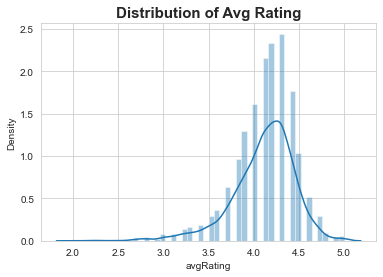

In [26]:
#Distribution of 'Rating':
sns.set_style(style='whitegrid')
sns.distplot(df_valid_Ratings['avgRating'])
plt.title('Distribution of Avg Rating',fontsize=15,fontweight='bold')

In [27]:
df.columns


Index(['type', 'id', 'name', 'uuid', 'city', 'area', 'avgRating',
       'totalRatingsString', 'cuisines', 'Delivery_Time (in min)', 'address',
       'locality', 'unserviceable', 'veg', 'count', 'Cost_for_Two (₹)'],
      dtype='object')

In [ ]:
Use SQL queries to extract relevant information from the dataset and perform initial exploratory data analysis.
Use data visualization techniques such as bar charts, line plots, and maps to gain a better understanding of the data.
Use statistical methods to analyze the data and identify patterns and trends.
Use machine learning techniques to build predictive models that can be used to make recommendations for restaurant owners and customers.
Summarize the findings and results of the analysis in a report and make recommendations for future research.
Expected Outcomes:

Understand the trends in the restaurant industry in metro cities
Identify the most popular cuisines, restaurant locations, and ratings
Identify areas that are under-served by the restaurant industry
Understand the sentiment of customer reviews
Provide recommendations for restaurant owners and customers
Provide insights for future research
This is a simple project idea, you can add more complexity and depth to it. Also it's good to use additional data sources to cross-verify and make more accurate predictions.

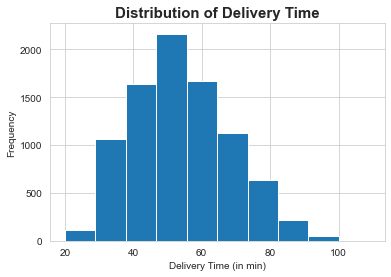

In [28]:
# visualize the distribution of 'Delivery_Time (in min)' column
plt.hist(df['Delivery_Time (in min)'])
plt.xlabel('Delivery Time (in min)')
plt.ylabel('Frequency')
plt.title('Distribution of Delivery Time',fontsize=15,fontweight='bold')
plt.show()

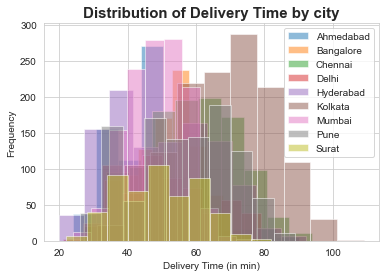

In [29]:
# group the data by 'city' column
grouped = df.groupby(by='city')

# create a histogram for each city
for name, group in grouped:
    plt.hist(group['Delivery_Time (in min)'], alpha=0.5, label=name)
    plt.xlabel('Delivery Time (in min)')
    plt.ylabel('Frequency')
    plt.title('Distribution of Delivery Time by city',fontsize=15,fontweight='bold')
    plt.legend()

plt.show()

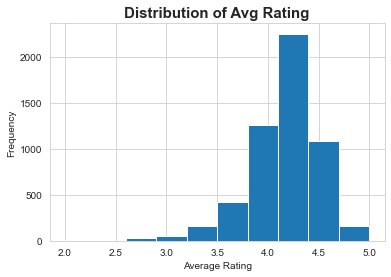

In [30]:
# visualize the distribution of 'avgRating' column
plt.hist(df_valid_Ratings['avgRating'])
plt.xlabel('Average Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Avg Rating',fontsize=15,fontweight='bold')
plt.show()

Text(0.5, 0, 'Delivery Time (in min)')

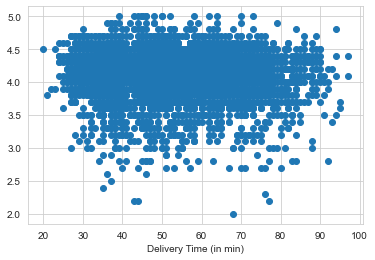

In [31]:
# create a scatter plot of 'Delivery_Time (in min)' vs 'avgRating'
plt.scatter(df_valid_Ratings['Delivery_Time (in min)'], df_valid_Ratings['avgRating'])
plt.xlabel('Delivery Time (in min)')

In [32]:
df.groupby('name')['Cost_for_Two (₹)'].mean().nlargest(10)

name
ITC Windsor - Gourmet Couch             2500.0
Malgudi - The Savera Hotel              2500.0
Origami Japanese & Korean Restaurant    2500.0
CONRAD PUNE                             2000.0
Cafe Delhi Heights                      2000.0
Lubov Patisserie by Frozen Bottle       2000.0
Yauatcha                                2000.0
Chin Chin - The Residency               1900.0
Pukhtaan                                1900.0
Celini - Grand Hyatt Mumbai             1800.0
Name: Cost_for_Two (₹), dtype: float64

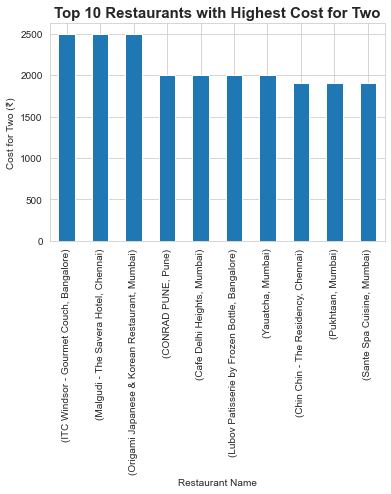

In [33]:
df.groupby(['name','city'])['Cost_for_Two (₹)'].mean().nlargest(10).plot.bar()
plt.xlabel('Restaurant Name')
plt.ylabel('Cost for Two (₹)')
plt.title('Top 10 Restaurants with Highest Cost for Two', fontsize=15,fontweight='bold')
plt.show()

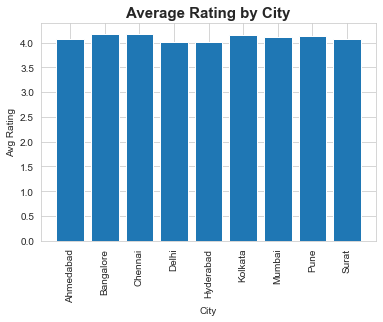

In [34]:
grouped = df_valid_Ratings.groupby(by='city')['avgRating'].mean().reset_index()

# create a bar chart
plt.bar(grouped['city'], grouped['avgRating'])
plt.xlabel('City')
plt.ylabel('Avg Rating')
plt.title('Average Rating by City', fontsize=15,fontweight='bold')
plt.xticks(rotation=90)
plt.show()

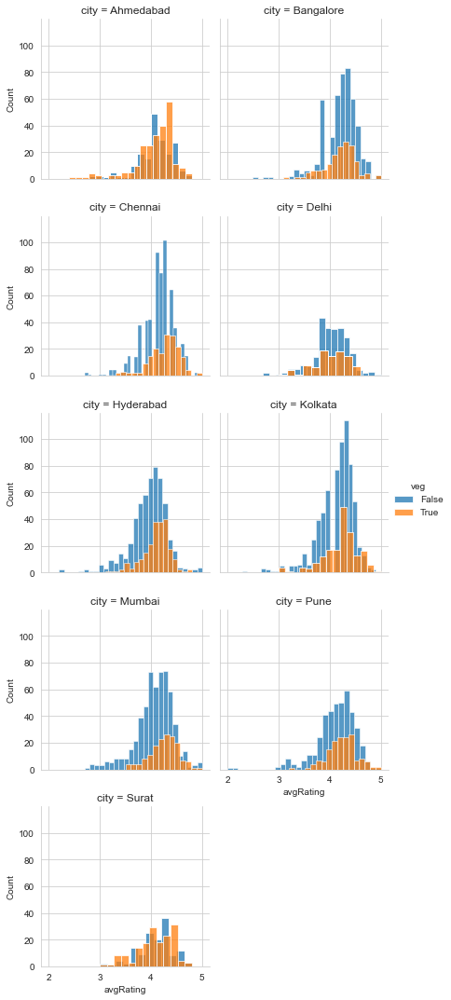

In [35]:
g = sns.FacetGrid(df_valid_Ratings, col='city', hue='veg', col_wrap=2)
g.map(sns.histplot, "avgRating")
g.add_legend()

for ax in g.axes.flat:
    ax.set_title(ax.get_title(), fontsize=12)

plt.show()

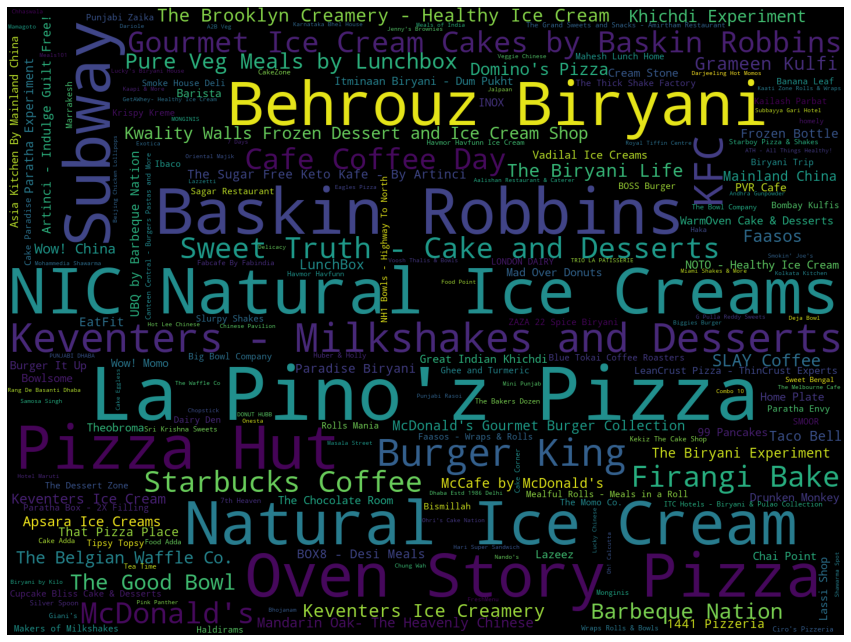

In [49]:
from subprocess import check_output
from wordcloud import WordCloud
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

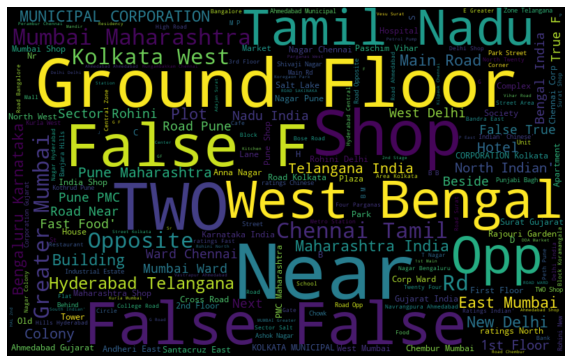

In [50]:
df['address'] = df['address'].astype(str)
text = " ".join(review for review in df.address)
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(text)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

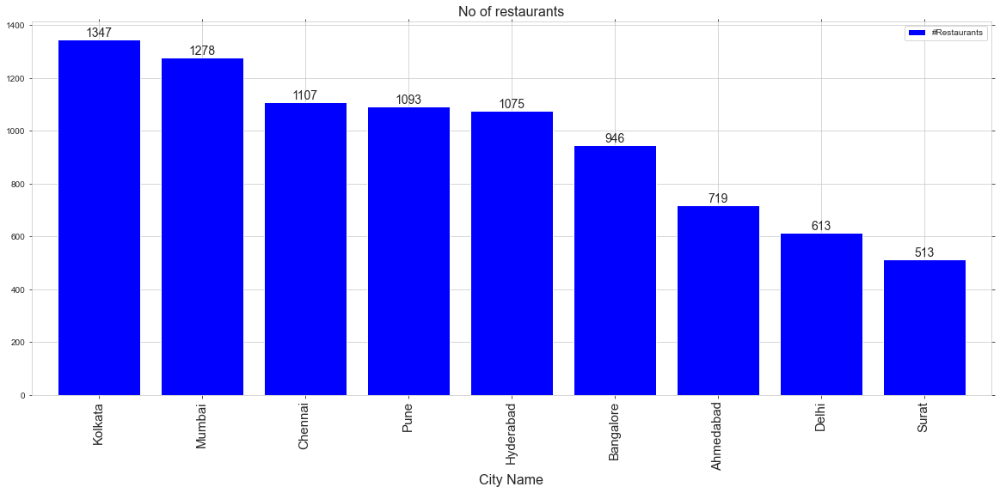

In [51]:
# count the number of restaurants in each city
histo = df['city'].value_counts()

# create the bar plot
ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['blue'])

# add labels to the bars
rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

# remove borders and set x-tick labels
ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

# add legend and title
ax.legend(fontsize=14)
ax.set_title('No of restaurants', fontsize=16)
ax.set_xlabel('City Name', fontsize=16)
ax.legend(['#Restaurants'])

# set background color
ax.set_facecolor("white")

# show the plot
plt.show()


### Analysis of Restaurants in Kolkata

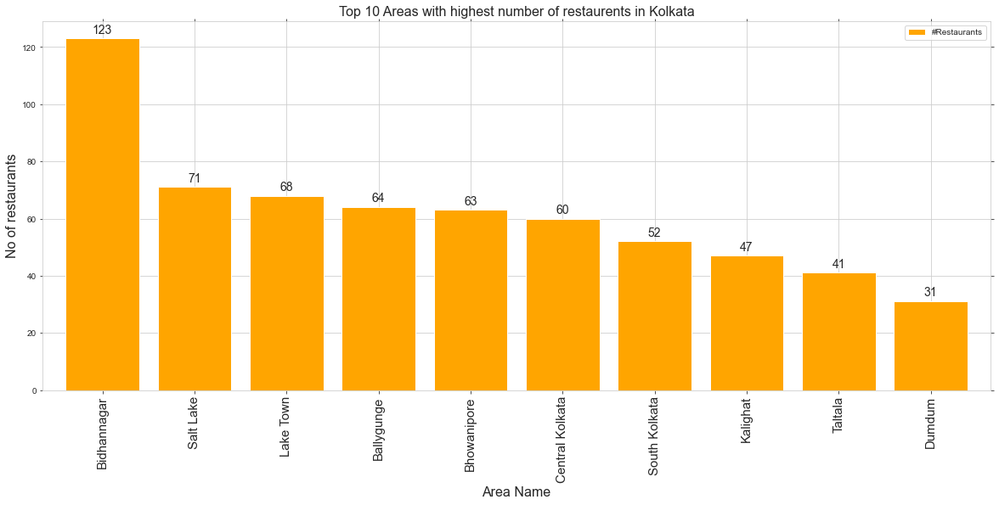

In [66]:
# filter dataframe for Kolkata city
df_kolkata = df[df['city'] == 'Kolkata']

# count the number of restaurants in each area in Kolkata city
histo = df_kolkata['area'].value_counts().nlargest(10)

# create the bar plot
ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

# add labels to the bars
rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

# remove borders and set x-tick labels
ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

# add legend and title
ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Kolkata', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

# set background color
ax.set_facecolor("white")

# show the plot
plt.show()


In [73]:
df_kolkata.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
4460,F,199142,Acs Chinese Flavour,20350b46-0f67-459a-8741-9a3c08cd82ec,Kolkata,Taltala,4.0,500+ ratings,['Chinese'],45,8 Eliot Road Taltala Kolkata West Bengal India,Esplanade,False,False,0,300
4461,F,101421,Mughal Arsalan Biryani,85307ece-3a0e-4595-bc37-485261ede304,Kolkata,College Square,4.0,5000+ ratings,['Indian' 'Biryani'],31,112 b mahatma gandhi road,MG road,False,False,0,200
4462,F,462917,NEW ARSALAAN'S KITCHEN,e921d67b-a064-4245-b07a-d3e10ef1d50e,Kolkata,Burrabazar,0.0,Too Few Ratings,['Indian' 'Snacks'],37,5/H/14 Achambit Shah Road,Burrabazar,False,False,0,100
4463,F,179446,Silver Spoon,c50cbf80-ab70-4971-a052-b83342744ff8,Kolkata,Taltala,3.9,100+ ratings,['Chinese' 'Tibetan'],52,35/1A McLeod Street Kolkata 700017,McLeod Street,False,False,0,400
4464,F,426940,MAHAL RESTAURANT,22e03859-a017-45ba-8091-d5179642627d,Kolkata,Burrabazar,0.0,Too Few Ratings,['Bengali' 'Indian'],41,6/3 RAMANATH MAZUMDER STREET WARD NO-40 KOLKAT...,Burrabazar,False,False,0,200


In [74]:
df_kolkata['cuisines'] = df_kolkata['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_3872\3189856478.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [75]:
df_kolkata

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
4460,F,199142,Acs Chinese Flavour,20350b46-0f67-459a-8741-9a3c08cd82ec,Kolkata,Taltala,4.0,500+ ratings,'Chinese',45,8 Eliot Road Taltala Kolkata West Bengal India,Esplanade,False,False,0,300
4461,F,101421,Mughal Arsalan Biryani,85307ece-3a0e-4595-bc37-485261ede304,Kolkata,College Square,4.0,5000+ ratings,'Indian' 'Biryani',31,112 b mahatma gandhi road,MG road,False,False,0,200
4462,F,462917,NEW ARSALAAN'S KITCHEN,e921d67b-a064-4245-b07a-d3e10ef1d50e,Kolkata,Burrabazar,0.0,Too Few Ratings,'Indian' 'Snacks',37,5/H/14 Achambit Shah Road,Burrabazar,False,False,0,100
4463,F,179446,Silver Spoon,c50cbf80-ab70-4971-a052-b83342744ff8,Kolkata,Taltala,3.9,100+ ratings,'Chinese' 'Tibetan',52,35/1A McLeod Street Kolkata 700017,McLeod Street,False,False,0,400
4464,F,426940,MAHAL RESTAURANT,22e03859-a017-45ba-8091-d5179642627d,Kolkata,Burrabazar,0.0,Too Few Ratings,'Bengali' 'Indian',41,6/3 RAMANATH MAZUMDER STREET WARD NO-40 KOLKAT...,Burrabazar,False,False,0,200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5802,F,405657,Morning Bites,1e3c8180-1218-40a8-a893-a281933a18a6,Kolkata,Santoshpur,0.0,Too Few Ratings,'South Indian',93,Upohar flat no. 3 3rd floor 24 Purbachal Main ...,Santoshpur,False,False,0,300
5803,F,376701,RAJGHARANA,abe5def0-d15c-418a-bb93-0700bd183903,Kolkata,Baguiati,0.0,Too Few Ratings,'Indian' 'Chinese' 'South Indian' 'Bengali'...,88,GA-45 Shop No. 3 Ground floor Dasabhuja Apar...,Lake Town,False,False,0,300
5804,F,331515,Hotlets & Wiches,cb977a3d-798f-4af3-981a-c6d4a894069d,Kolkata,Behala,0.0,Too Few Ratings,'Fast Food',93,85 ROY BAHADUR ROAD(MAIL-204/A ROY BAHADUR R...,Alipore,False,False,0,300
5805,F,91758,Dough Knots,98c0a8ce-ae83-49a1-87e3-278690ba251a,Kolkata,Behala,4.1,100+ ratings,'Desserts' 'Bakery' 'Snacks',87,204/A Roy Bahadur Road Behala Kolkata,Roy Bahadur Road Near Leather Company,False,False,0,200


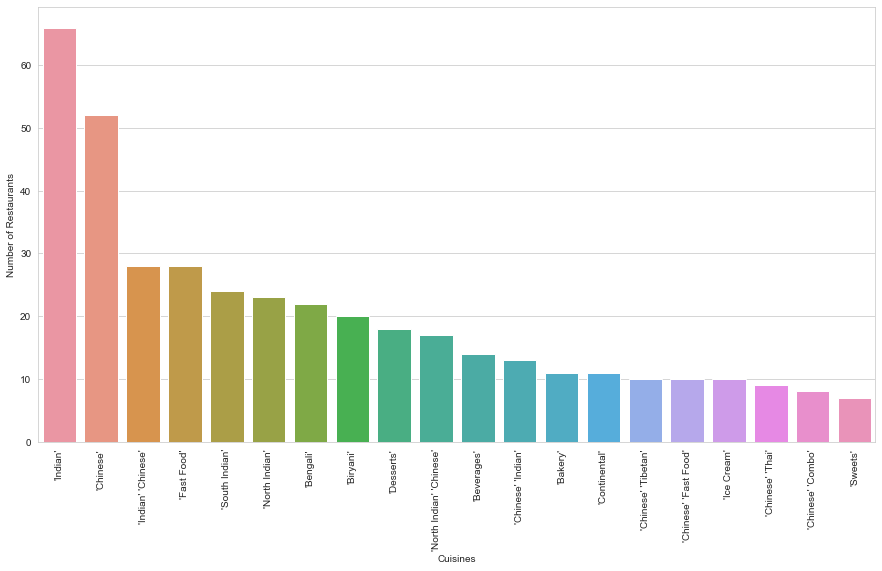

In [77]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_kolkata.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

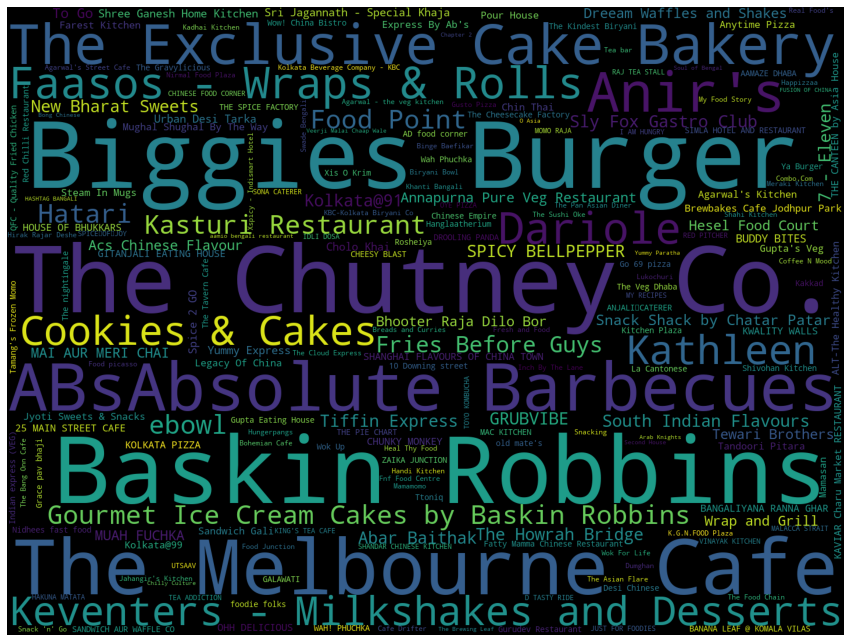

In [67]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_kolkata['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

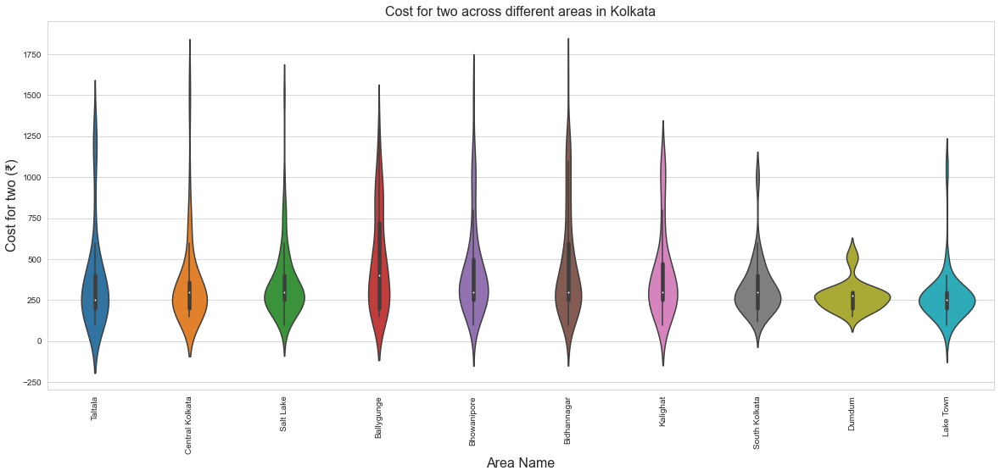

In [54]:
plt.figure(figsize=(20, 8))
# count the number of restaurants in each area in Kolkata city
top_10_areas = df_kolkata['area'].value_counts().nlargest(10).index

# create the violin plot with only the top 10 areas
sns.violinplot(x='area', y='Cost_for_Two (₹)', data=df_kolkata[df_kolkata['area'].isin(top_10_areas)])
plt.title('Cost for two across different areas in Kolkata', fontsize=16)
plt.xlabel('Area Name', fontsize=16)
plt.ylabel('Cost for two (₹)', fontsize=16)
plt.xticks(rotation=90)
plt.show()


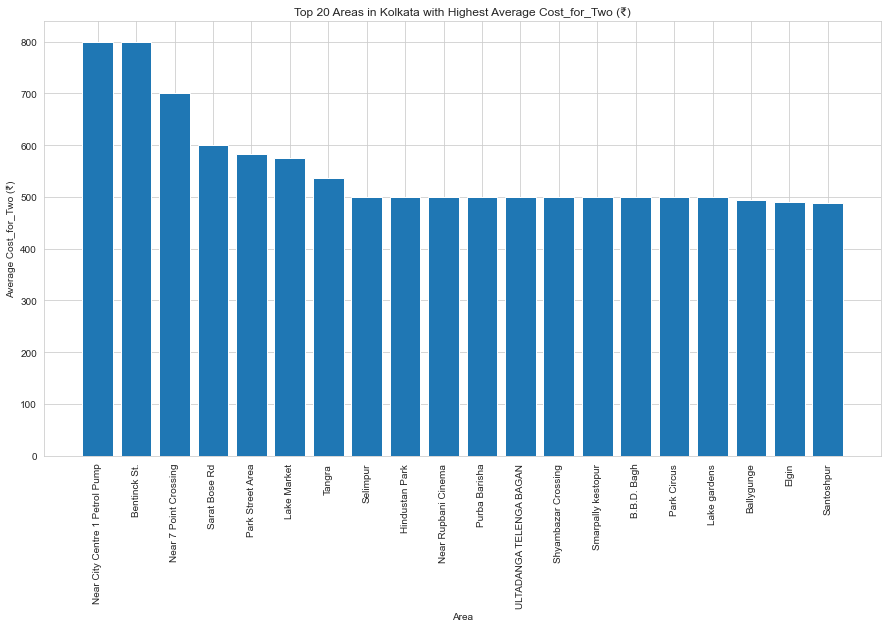

In [72]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_kolkata.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Kolkata with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

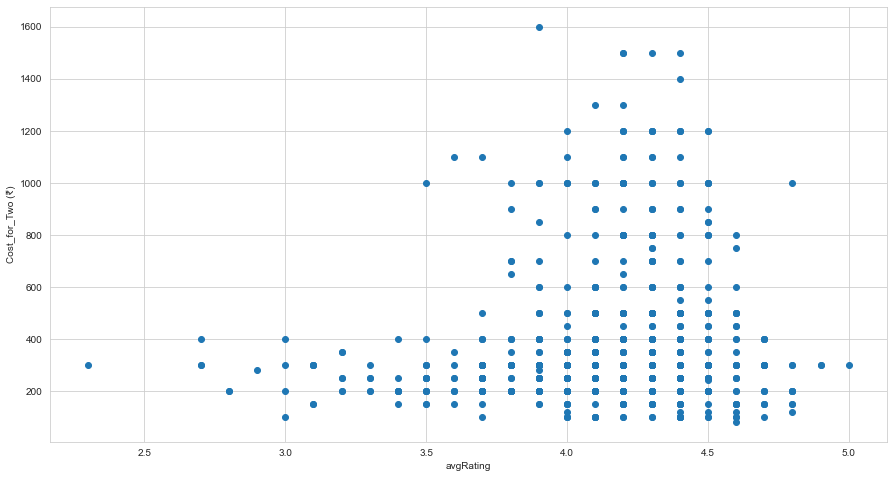

In [79]:
# Create a new dataset with avgRating > 0
df_kolkata_filtered = df_kolkata[df_kolkata['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_kolkata_filtered['avgRating'], df_kolkata_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [56]:
# create empty lists to store the latitude and longitude values
latitude = []
longitude = []

# iterate through the unique area names in df_kolkata
for area in df_kolkata['area'].unique():
    # use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Kolkata, India')
    if location:
        # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
        # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)

# create new columns in df_kolkata for the latitude and longitude values
df_kolkata['area_latitude'] = df_kolkata['area'].map(dict(zip(df_kolkata['area'].unique(), latitude)))
df_kolkata['area_longitude'] = df_kolkata['area'].map(dict(zip(df_kolkata['area'].unique(), longitude)))

# drop rows with missing latitude and longitude values
df_kolkata.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)


C:\Users\user\AppData\Local\Temp\ipykernel_3872\928604444.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\928604444.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\928604444.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [57]:
import folium

kolkata_latitude = 22.572645
kolkata_longitude = 88.363892

map_kolkata = folium.Map(location=[kolkata_latitude, kolkata_longitude], zoom_start=11)

for lat, lng, name in zip(df_kolkata['area_latitude'], df_kolkata['area_longitude'], df_kolkata['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_kolkata)  

map_kolkata


In [58]:
from folium.plugins import HeatMap

# create a map centered around Kolkata
kolkata_latitude = 22.572645
kolkata_longitude = 88.363892
map_kolkata = folium.Map(location=[kolkata_latitude, kolkata_longitude], zoom_start=11)

# group df_kolkata by area and count the number of restaurants in each area
area_count = df_kolkata.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')

# create a heatmap layer on the map using the area coordinates and restaurant counts
HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_kolkata)
# display the map
map_kolkata

### Analysis of Restaurants in Mumbai

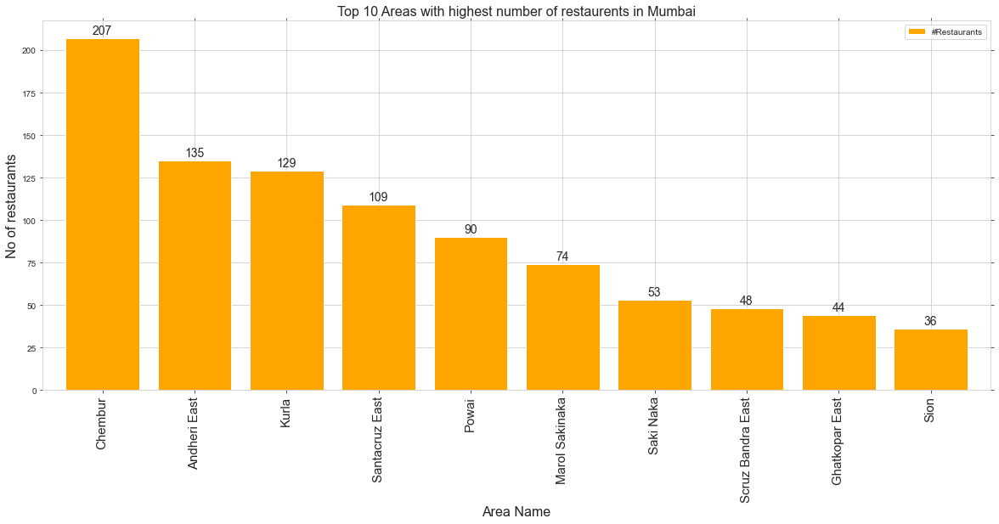

In [94]:
# filter dataframe for Mumbai city
df_mumbai = df[df['city'] == 'Mumbai']

histo = df_mumbai['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Mumbai', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

In [ ]:
Chembur has the highest number of restaurents in Mumbai

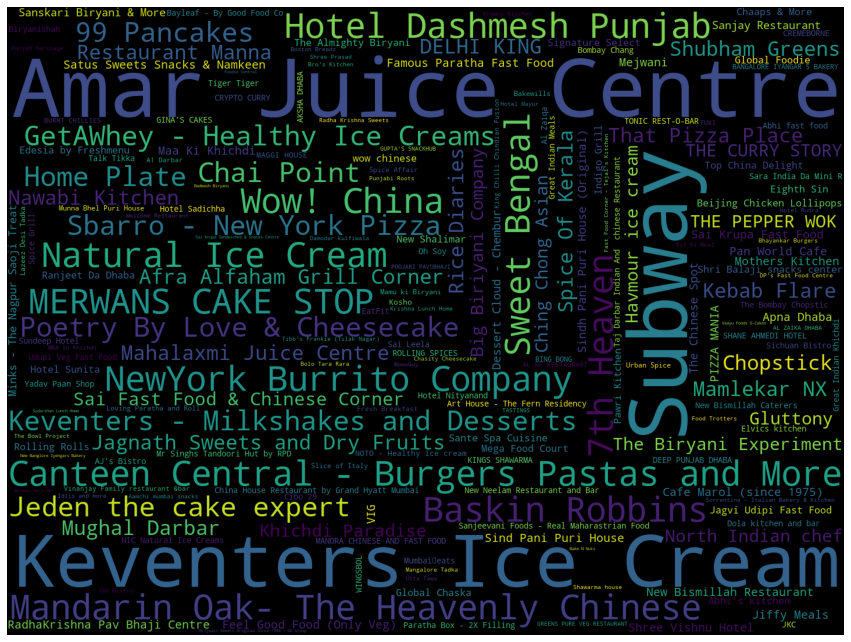

In [81]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_mumbai['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [82]:
df_mumbai.head()

,type,id,name,uuid,city,area,avgRating,totalRatingsString,cuisines,Delivery_Time (in min),address,locality,unserviceable,veg,count,Cost_for_Two (₹)
5807,F,34020,Indigo Grill,152f1a98-8b18-4397-be8f-b9fed6499f20,Mumbai,Chembur,3.9,500+ ratings,['North Indian' 'Chinese' 'Mughlai' 'Biryani' ...,44,112-2-2 S.G. Barve Marg Opposite Swastik Chamb...,Chembur,False,False,0,400
5808,F,355806,Baba Falooda (Kurla),384970ad-6ed8-455a-acf6-5493551f5893,Mumbai,Kurla,4.4,1000+ ratings,['Ice Cream' 'Beverages' 'Desserts'],27,TAYYAB MANZIL shop no 123 L.B.S Marg KURLA WE...,Powai,False,False,0,200
5809,F,19344,Deluxe Restaurant,0320578b-9d84-46c6-814f-f48c0a3c90c0,Mumbai,Kurla,4.2,500+ ratings,['Mughlai' 'Chinese'],33,Mubeen Manzil Near Peninsula Park Lbs Marg Ban...,Kurla,False,False,0,400
5810,F,74549,Sahara Restaurant,94c51cc0-8d7a-4099-a0fe-387cc4a319c4,Mumbai,Chembur,4.0,1000+ ratings,['Indian' 'Chinese' 'Tandoor' 'Mughlai' 'Birya...,37,12 Opposite Swastik Chambers chembur CST Road ...,SHIVAJI NAGAR CST ROAD,False,False,0,300
5811,F,106763,Rangoon Zaika,cd078e24-0fae-46d9-9e45-ccedc30a0834,Mumbai,Kurla West,3.6,500+ ratings,['Indian' 'Chinese'],33,Shop 4B-4C Opposite Kalpana Cinema Beside Ansa...,Kurla,False,False,0,400


In [83]:
df_mumbai['cuisines'] = df_mumbai['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_3872\857300901.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



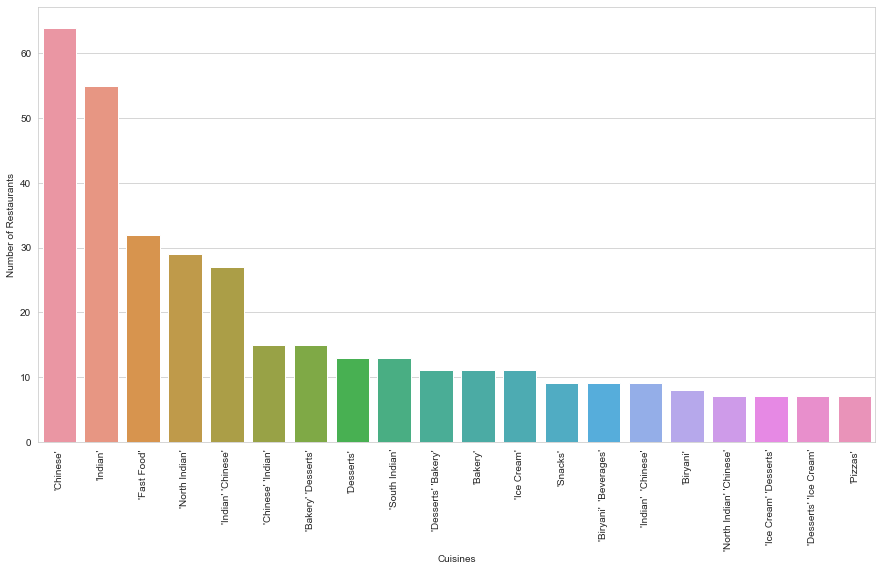

In [84]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_mumbai.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

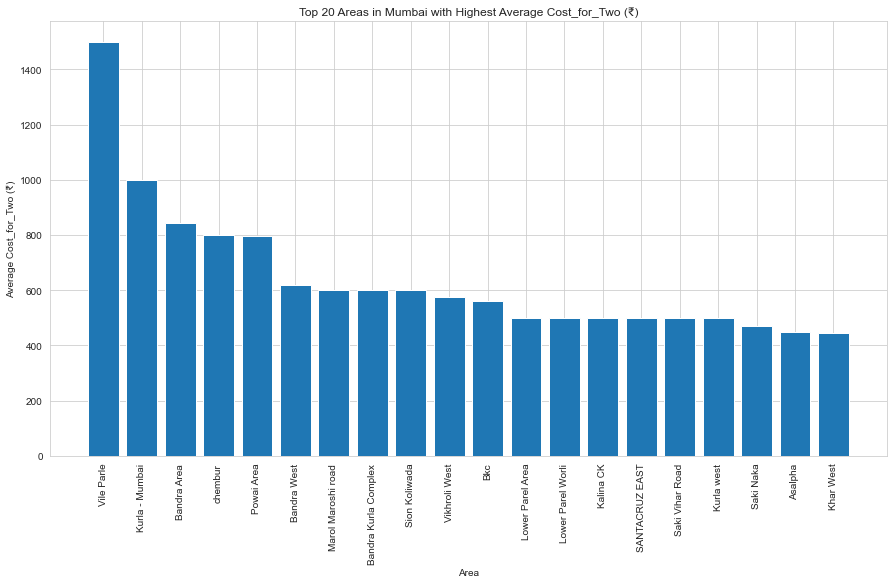

In [95]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_mumbai.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Mumbai with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

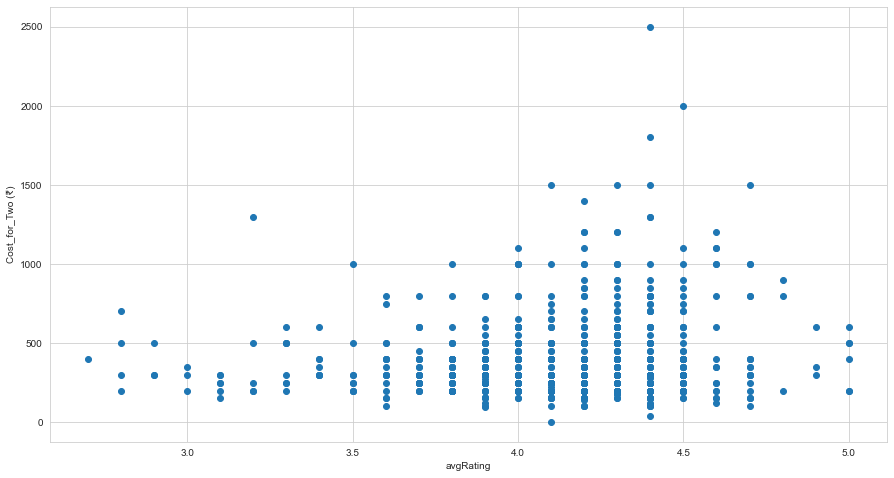

In [86]:
# Create a new dataset with avgRating > 0
df_mumbai_filtered = df_mumbai[df_mumbai['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_mumbai_filtered['avgRating'], df_mumbai_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [88]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_mumbai
for area in df_mumbai['area'].unique():
# use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Mumbai, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)

#create new columns in df_mumbai for the latitude and longitude values
df_mumbai['area_latitude'] = df_mumbai['area'].map(dict(zip(df_mumbai['area'].unique(), latitude)))
df_mumbai['area_longitude'] = df_mumbai['area'].map(dict(zip(df_mumbai['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_mumbai.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_3872\2897586902.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\2897586902.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\2897586902.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

In [89]:
mumbai_latitude = 19.0760
mumbai_longitude = 72.8777

map_mumbai = folium.Map(location=[mumbai_latitude, mumbai_longitude], zoom_start=11)

for lat, lng, name in zip(df_mumbai['area_latitude'], df_mumbai['area_longitude'], df_mumbai['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_mumbai)

map_mumbai

In [90]:
#create a map centered around Mumbai
mumbai_latitude = 19.0760
mumbai_longitude = 72.8777
map_mumbai = folium.Map(location=[mumbai_latitude, mumbai_longitude], zoom_start=11)

#group df_mumbai by area and count the number of restaurants in each area
area_count = df_mumbai.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')

#create a heatmap layer on the map using the area coordinates and restaurant counts
HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_mumbai)

#display the map
map_mumbai

### Analysis of Restaurants in Chennai

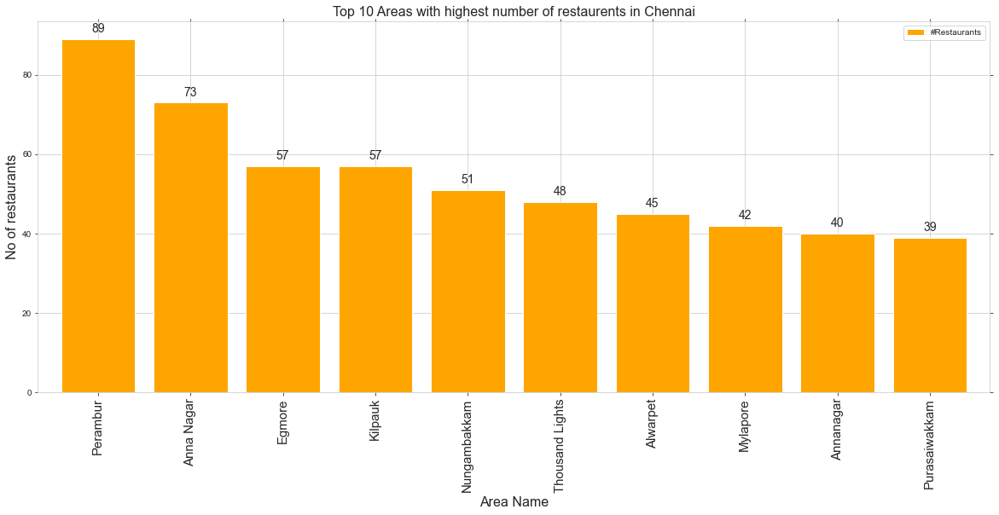

In [91]:
# filter dataframe for Chennai city
df_chennai = df[df['city'] == 'Chennai']

histo = df_chennai['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Chennai', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

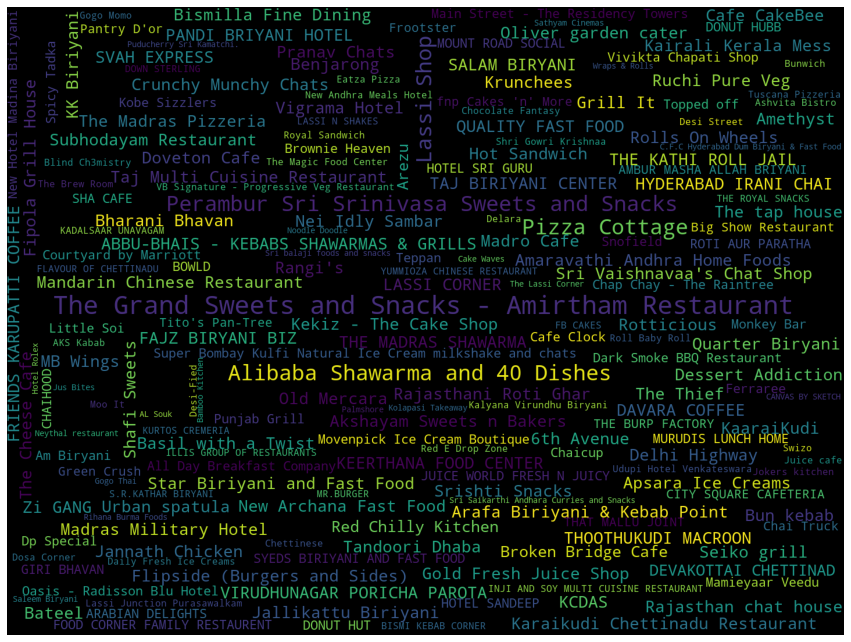

In [92]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_chennai['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [93]:
df_chennai['cuisines'] = df_chennai['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_3872\3530114214.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



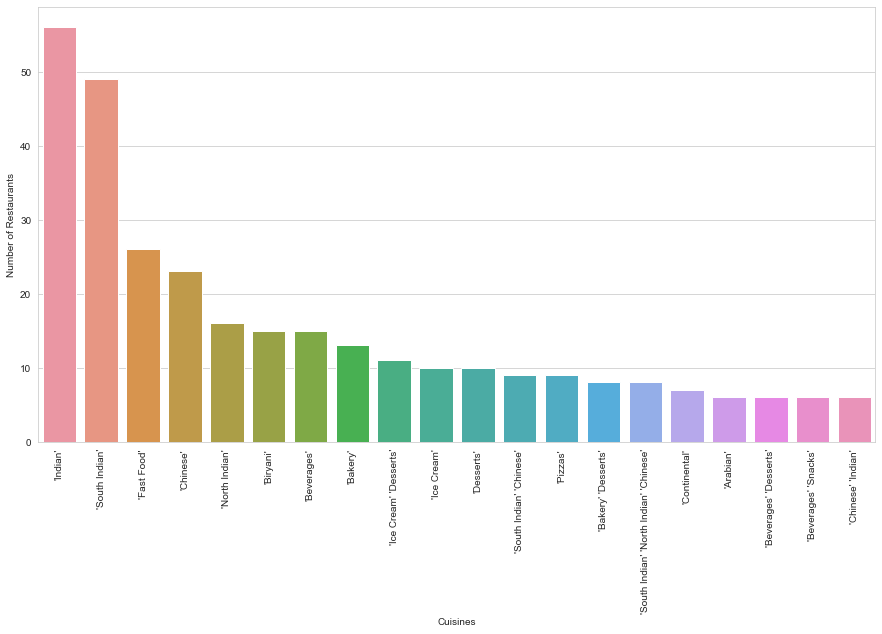

In [94]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_chennai.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

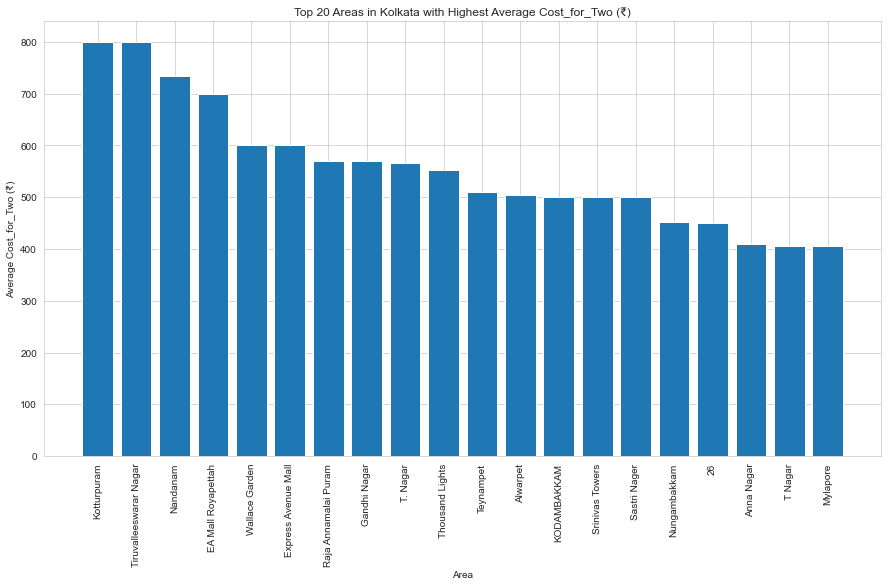

In [95]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_chennai.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Chennai with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

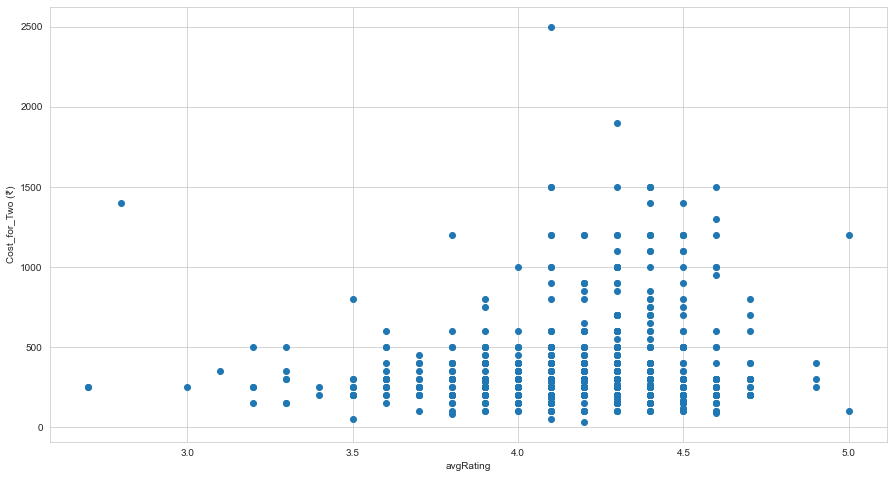

In [96]:
# Create a new dataset with avgRating > 0
df_chennai_filtered = df_chennai[df_chennai['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_chennai_filtered['avgRating'], df_chennai_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [97]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_chennai
for area in df_chennai['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Chennai, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_chennai for the latitude and longitude values
df_chennai['area_latitude'] = df_chennai['area'].map(dict(zip(df_chennai['area'].unique(), latitude)))
df_chennai['area_longitude'] = df_chennai['area'].map(dict(zip(df_chennai['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_chennai.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_3872\228288754.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\228288754.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_3872\228288754.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [98]:
chennai_latitude = 13.0827
chennai_longitude = 80.2707

map_chennai = folium.Map(location=[chennai_latitude, chennai_longitude], zoom_start=11)

for lat, lng, name in zip(df_chennai['area_latitude'], df_chennai['area_longitude'], df_chennai['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
    fill=True,
    fill_color='#3186cc',
    fill_opacity=0.7,
    parse_html=False).add_to(map_chennai)

map_chennai

In [99]:
#create a map centered around Chennai
chennai_latitude = 13.0827
chennai_longitude = 80.2707
map_chennai = folium.Map(location=[chennai_latitude, chennai_longitude], zoom_start=11)

#group df_chennai by area and count the number of restaurants in each area
area_count = df_chennai.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')

#create a heatmap layer on the map using the area coordinates and restaurant counts
HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_chennai)

#display the map
map_chennai

### Analysis of Restaurants in Pune

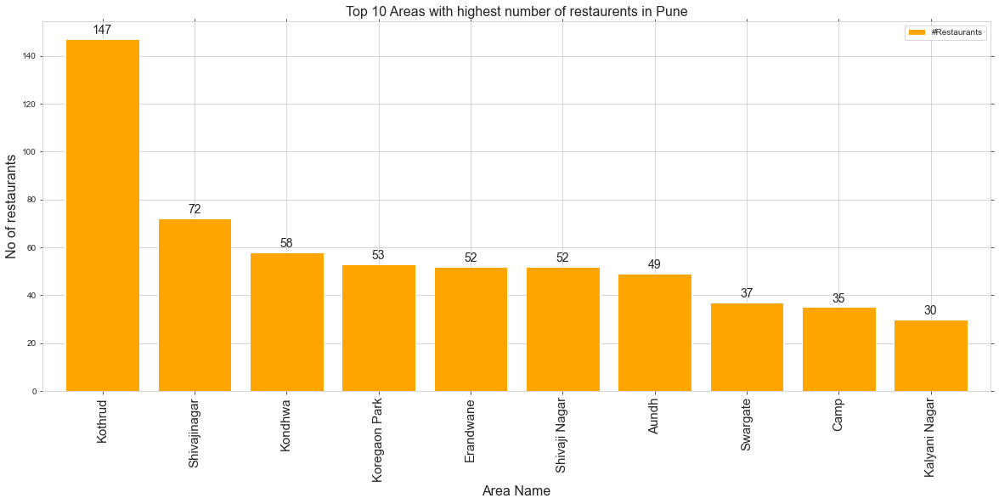

In [36]:
# filter dataframe for Pune city
df_pune = df[df['city'] == 'Pune']

histo = df_pune['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Pune', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

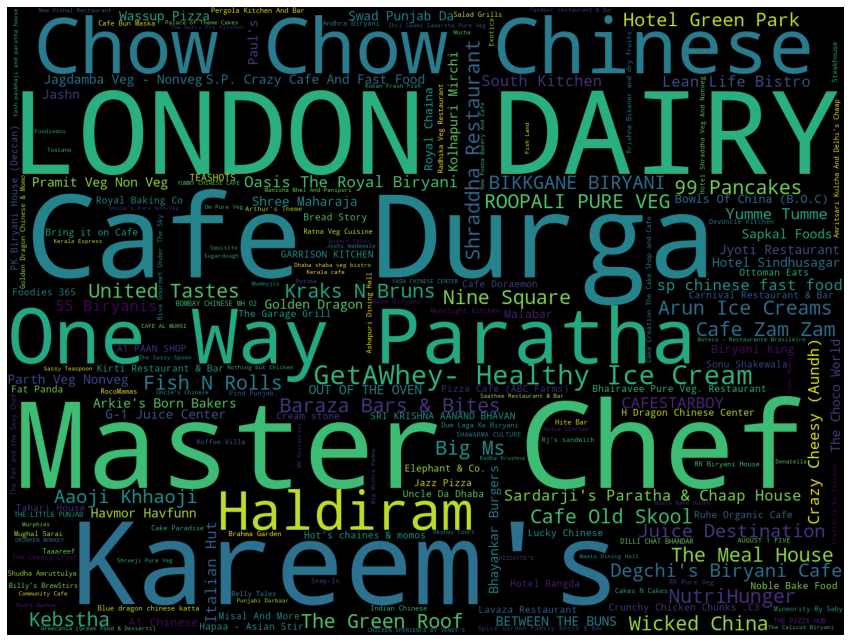

In [102]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_pune['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [103]:
df_pune['cuisines'] = df_pune['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_3872\2741691231.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



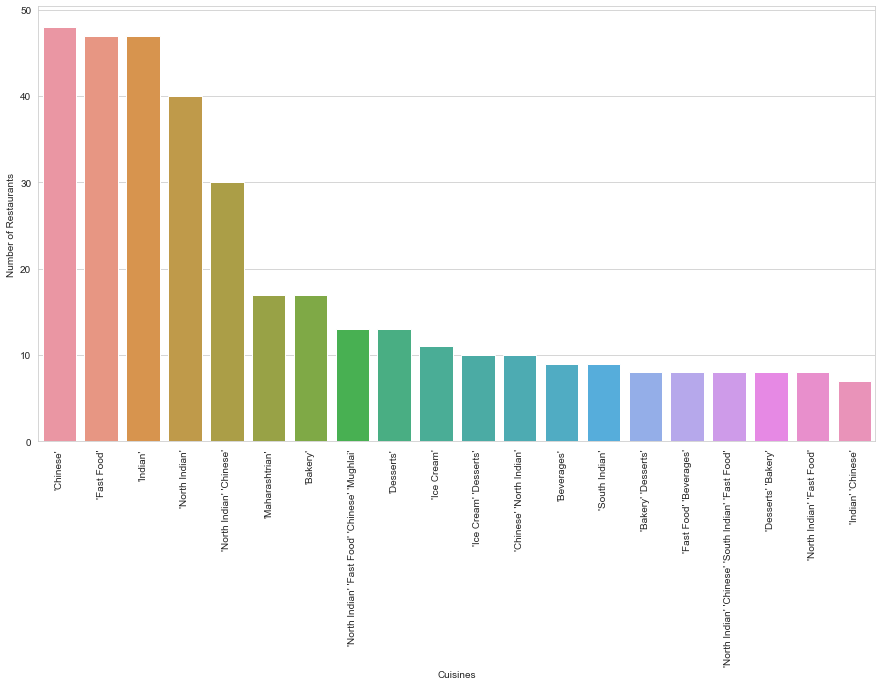

In [104]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_pune.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

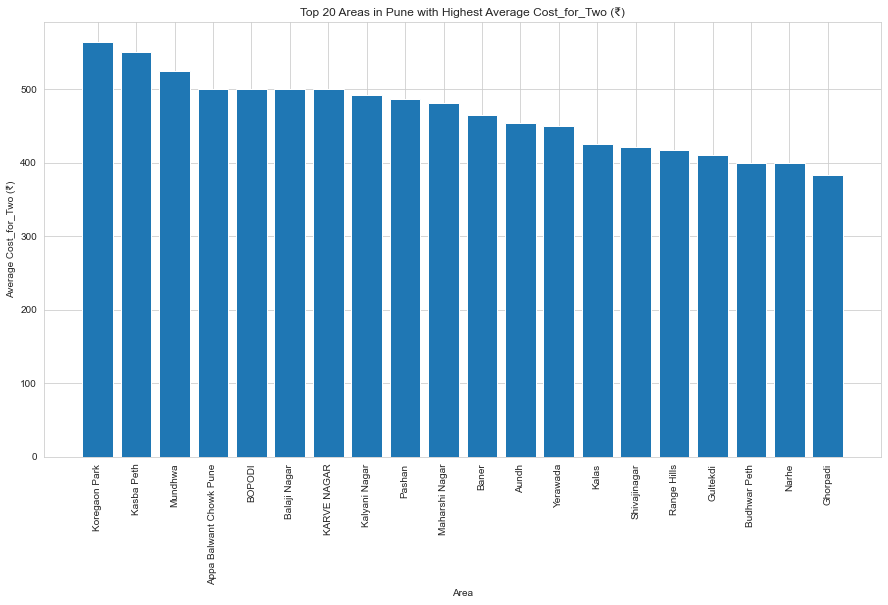

In [89]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_pune.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Pune with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

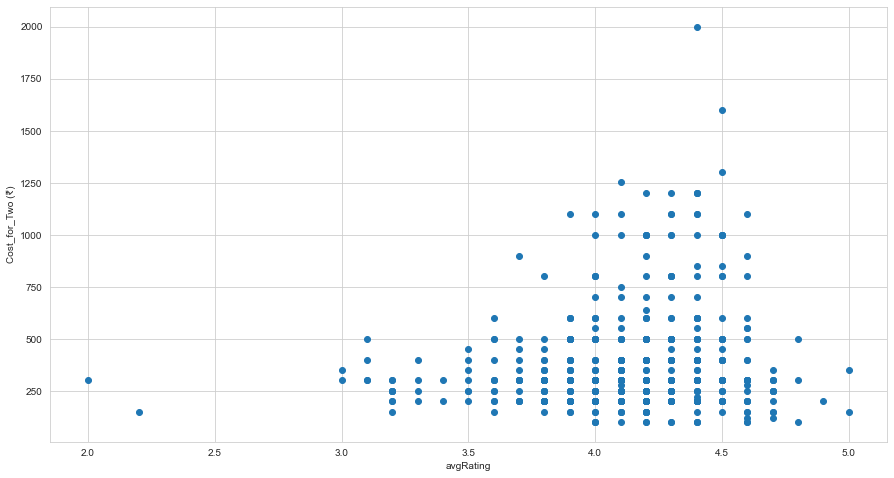

In [106]:
# Create a new dataset with avgRating > 0
df_pune_filtered = df_pune[df_pune['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_pune_filtered['avgRating'], df_pune_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [ ]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_pune
for area in df_pune['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Pune, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_pune for the latitude and longitude values
df_pune['area_latitude'] = df_pune['area'].map(dict(zip(df_pune['area'].unique(), latitude)))
df_pune['area_longitude'] = df_pune['area'].map(dict(zip(df_pune['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_pune.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

In [38]:
pune_latitude = 18.5204
pune_longitude = 73.8567

map_pune = folium.Map(location=[pune_latitude, pune_longitude], zoom_start=11)

for lat, lng, name in zip(df_pune['area_latitude'], df_pune['area_longitude'], df_pune['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_pune)

map_pune

In [44]:
import folium

pune_latitude = 18.5204
pune_longitude = 73.8567
map_pune = folium.Map(location=[pune_latitude, pune_longitude], zoom_start=11)

area_count = df_pune.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_pune)

map_pune


### Analysis of Restaurants in Hyderabad

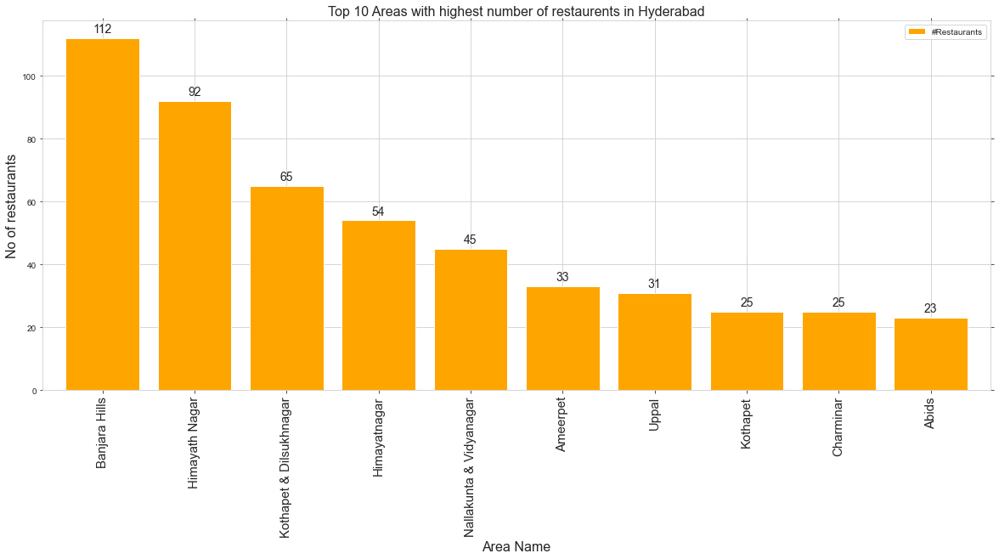

In [45]:
# filter dataframe for Hyderabad city
df_hyderabad = df[df['city'] == 'Hyderabad']

histo = df_hyderabad['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Hyderabad', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

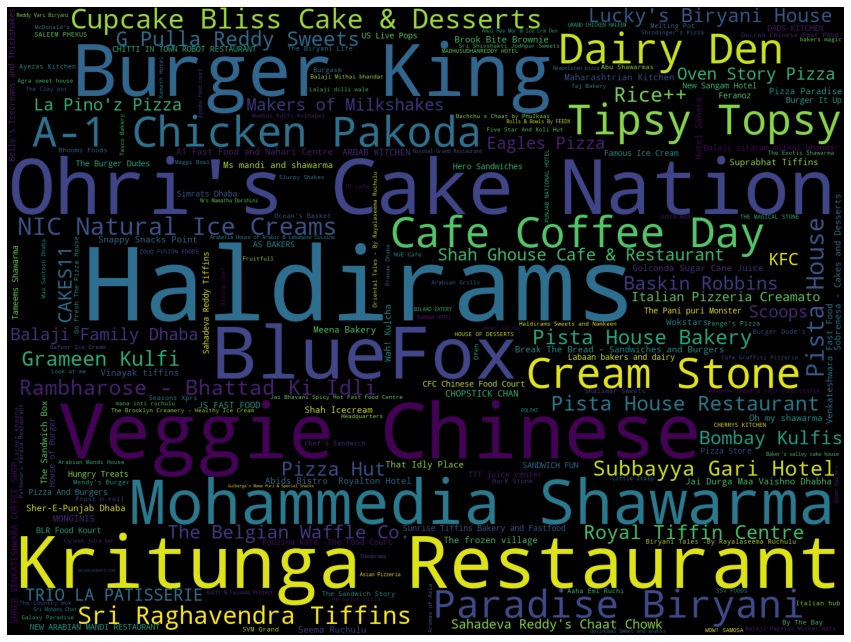

In [25]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_hyderabad['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [46]:
df_hyderabad['cuisines'] = df_hyderabad['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_12416\2719402937.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



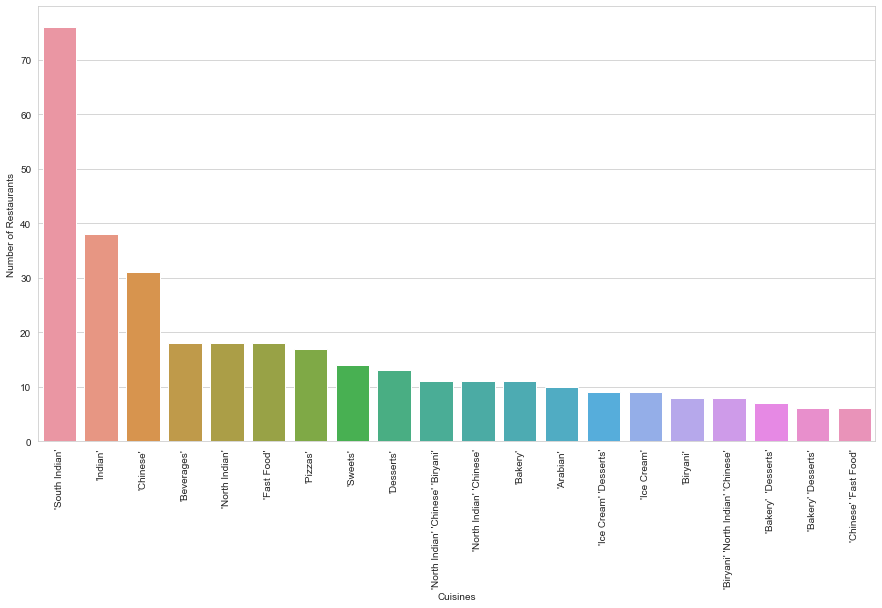

In [47]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_hyderabad.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

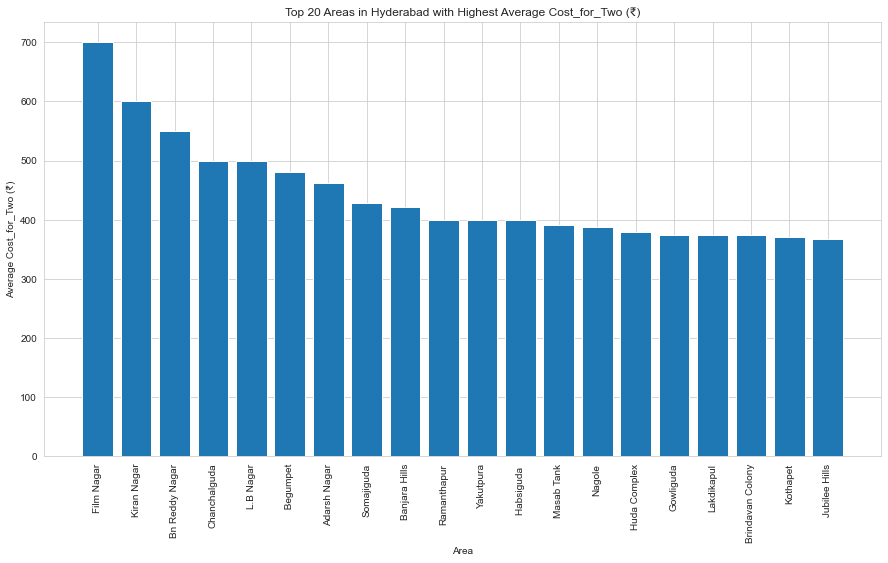

In [90]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_hyderabad.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Hyderabad with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

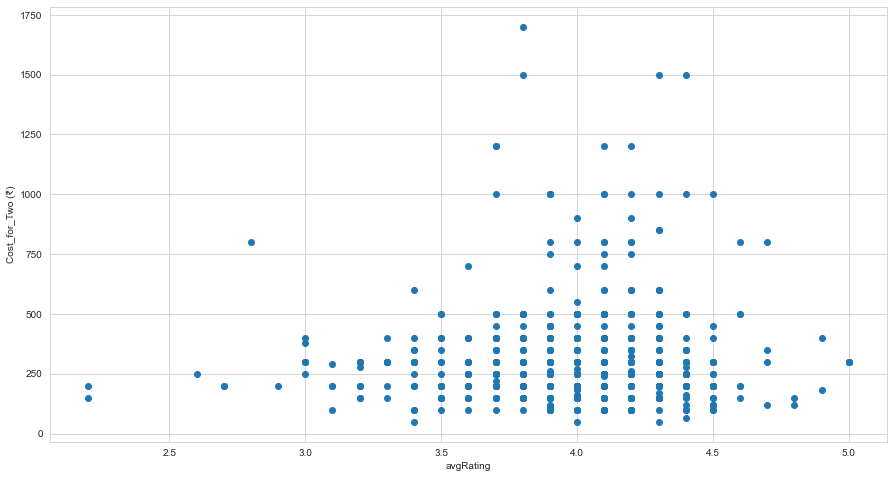

In [49]:
# Create a new dataset with avgRating > 0
df_hyderabad_filtered = df_hyderabad[df_hyderabad['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_hyderabad_filtered['avgRating'], df_hyderabad_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [50]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_hyderabad
for area in df_hyderabad['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Hyderabad, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_hyderabad for the latitude and longitude values
df_hyderabad['area_latitude'] = df_hyderabad['area'].map(dict(zip(df_hyderabad['area'].unique(), latitude)))
df_hyderabad['area_longitude'] = df_hyderabad['area'].map(dict(zip(df_hyderabad['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_hyderabad.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3217606508.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3217606508.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3217606508.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

In [51]:
hyderabad_latitude = 17.3850
hyderabad_longitude = 78.4867

map_hyderabad = folium.Map(location=[hyderabad_latitude, hyderabad_longitude], zoom_start=11)

for lat, lng, name in zip(df_hyderabad['area_latitude'], df_hyderabad['area_longitude'], df_hyderabad['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_hyderabad)

map_hyderabad

In [52]:
import folium

hyderabad_latitude = 17.3850
hyderabad_longitude = 78.4867
map_hyderabad = folium.Map(location=[hyderabad_latitude, hyderabad_longitude], zoom_start=11)

area_count = df_hyderabad.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_hyderabad)

map_hyderabad

### Analysis of Restaurants in Bangalore

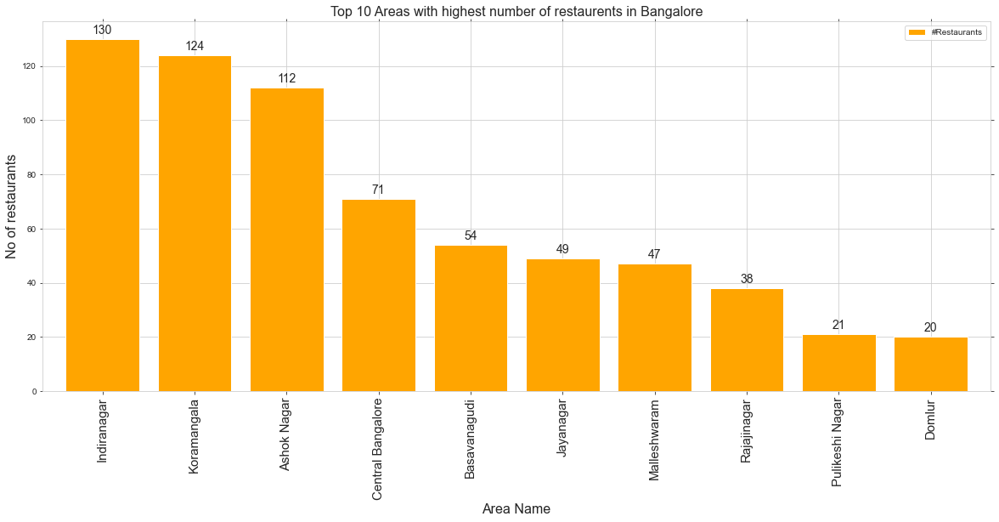

In [53]:
# filter dataframe for Bangalore city
df_bangalore = df[df['city'] == 'Bangalore']

histo = df_bangalore['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Bangalore', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

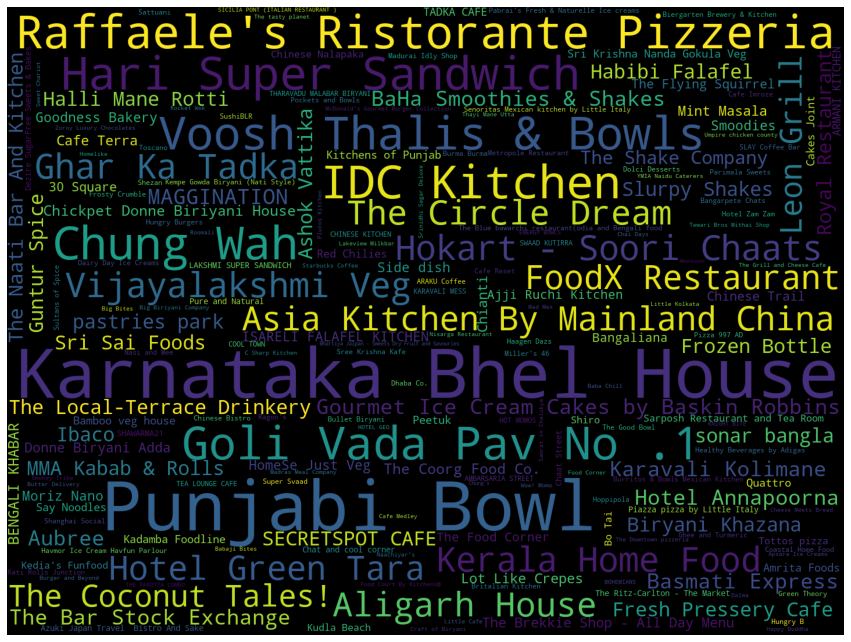

In [28]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_bangalore['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [54]:
df_bangalore['cuisines'] = df_bangalore['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_12416\1534488955.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



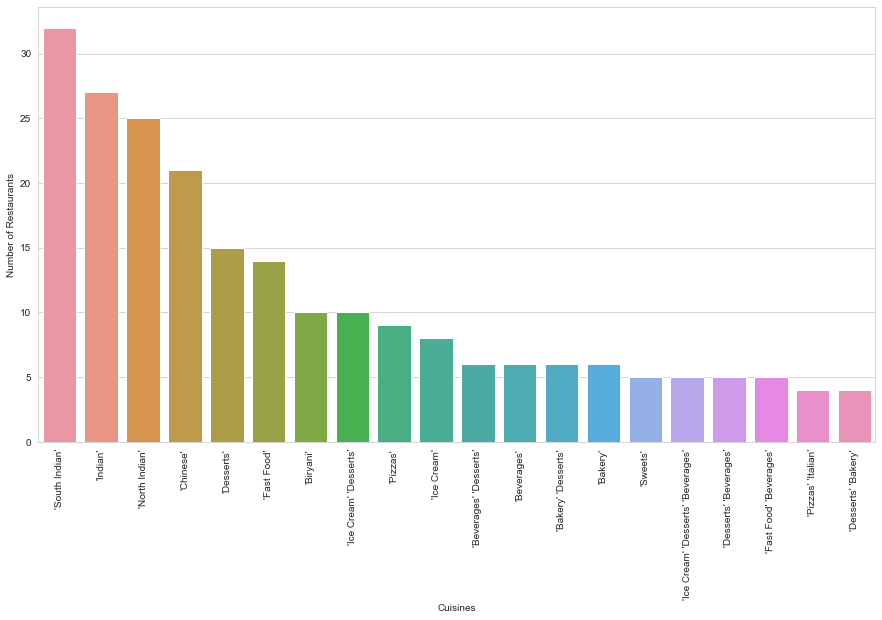

In [55]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_bangalore.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

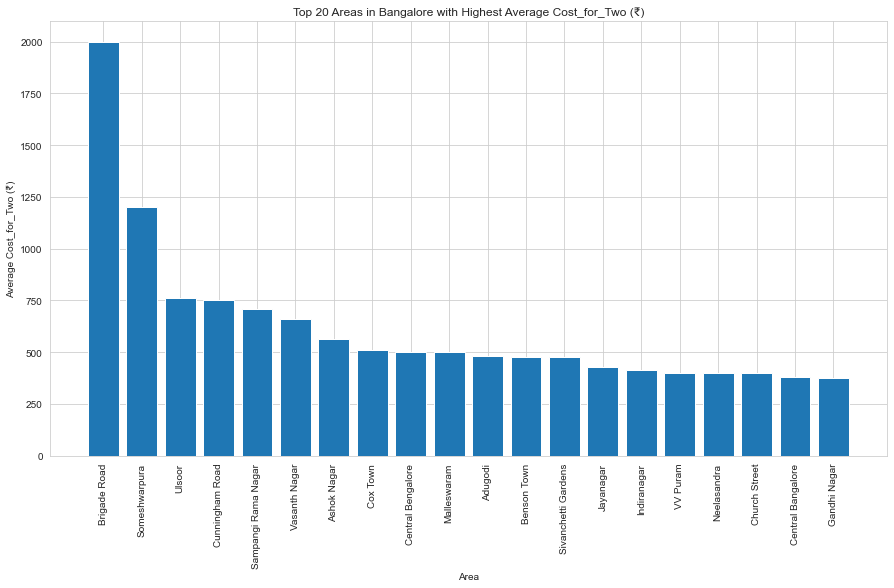

In [91]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_bangalore.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Bangalore with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

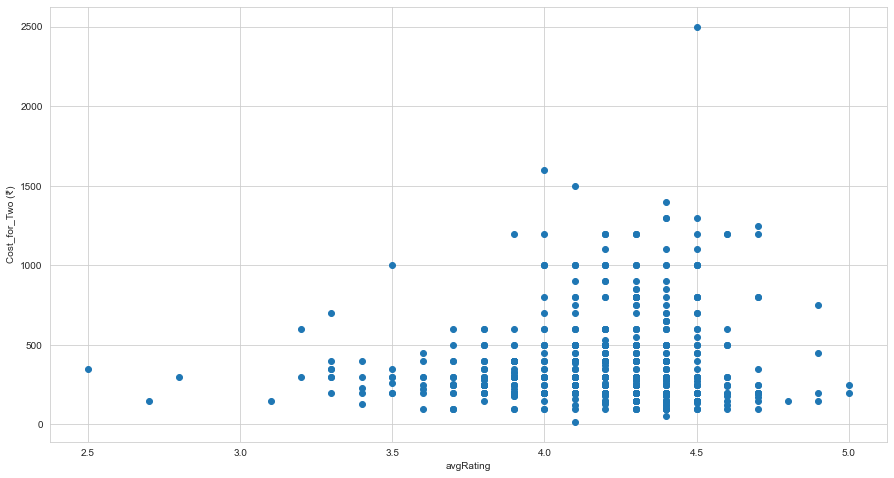

In [57]:
# Create a new dataset with avgRating > 0
df_bangalore_filtered = df_bangalore[df_bangalore['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_bangalore_filtered['avgRating'], df_bangalore_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [58]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_bangalore
for area in df_bangalore['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Bangalore, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_bangalore for the latitude and longitude values
df_bangalore['area_latitude'] = df_bangalore['area'].map(dict(zip(df_bangalore['area'].unique(), latitude)))
df_bangalore['area_longitude'] = df_bangalore['area'].map(dict(zip(df_bangalore['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_bangalore.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3770811350.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3770811350.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3770811350.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

In [59]:
bangalore_latitude = 12.9716
bangalore_longitude = 77.5946

map_bangalore = folium.Map(location=[bangalore_latitude, bangalore_longitude], zoom_start=11)

for lat, lng, name in zip(df_bangalore['area_latitude'], df_bangalore['area_longitude'], df_bangalore['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bangalore)

map_bangalore

In [60]:
import folium

bangalore_latitude = 12.9716
bangalore_longitude = 77.5946
map_bangalore = folium.Map(location=[bangalore_latitude, bangalore_longitude], zoom_start=11)

area_count = df_bangalore.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_bangalore)

map_bangalore

### Analysis of Restaurants in Ahmedabad

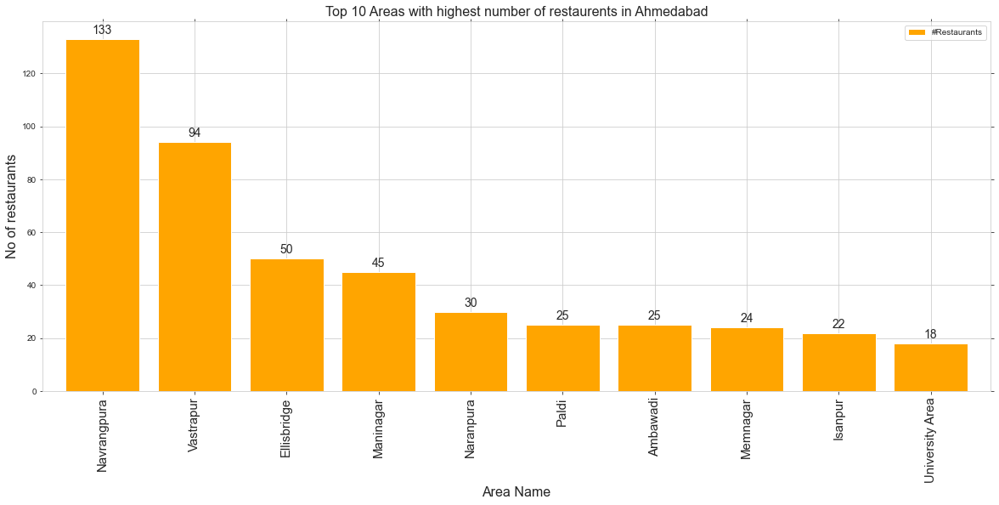

In [61]:
# filter dataframe for Ahmedabad city
df_ahmedabad = df[df['city'] == 'Ahmedabad']

histo = df_ahmedabad['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Ahmedabad', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

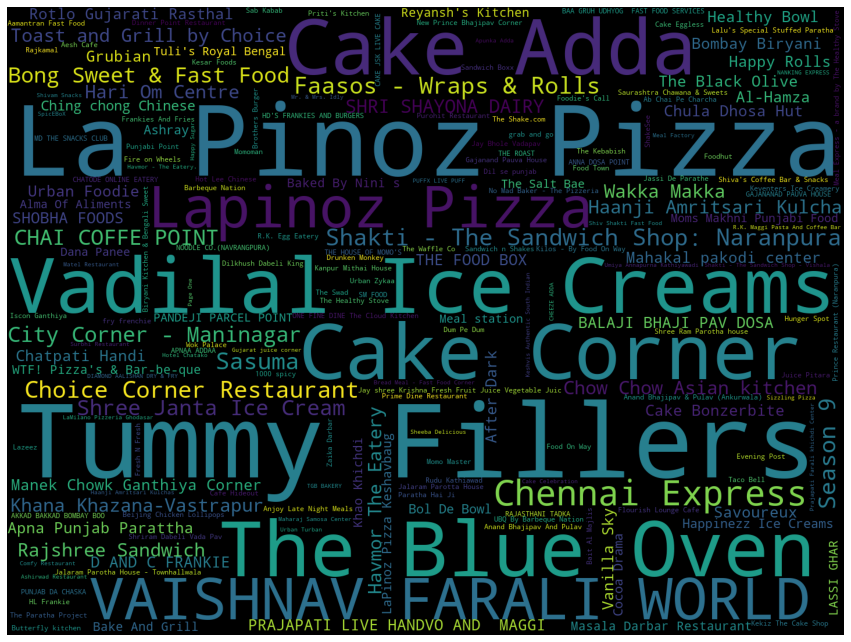

In [31]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_ahmedabad['name'].value_counts()))


fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [64]:
df_ahmedabad['cuisines'] = df_ahmedabad['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_12416\1059524957.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



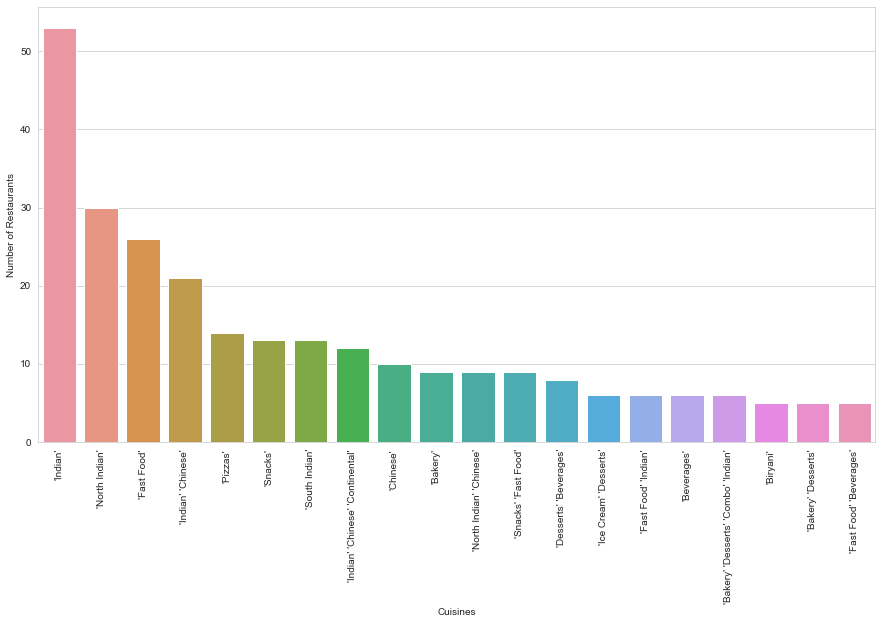

In [65]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_ahmedabad.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

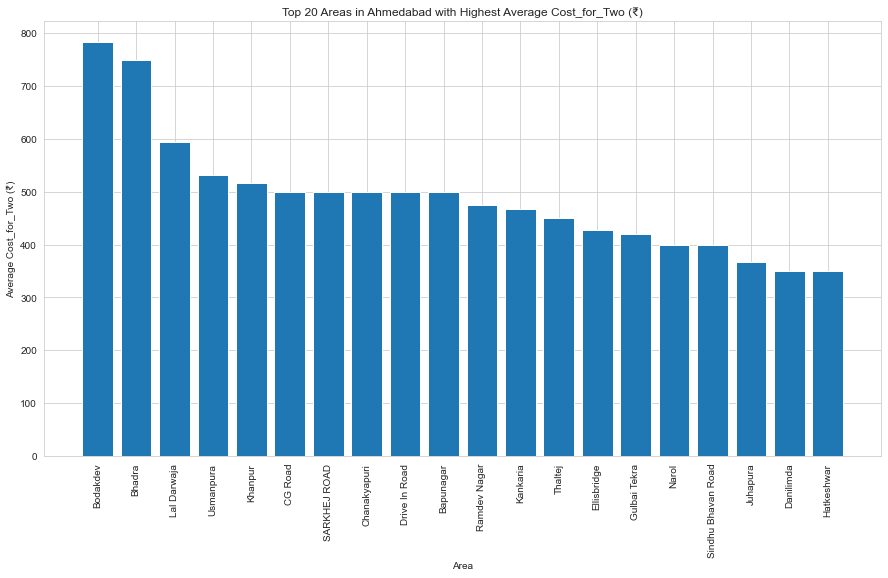

In [92]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_ahmedabad.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Ahmedabad with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

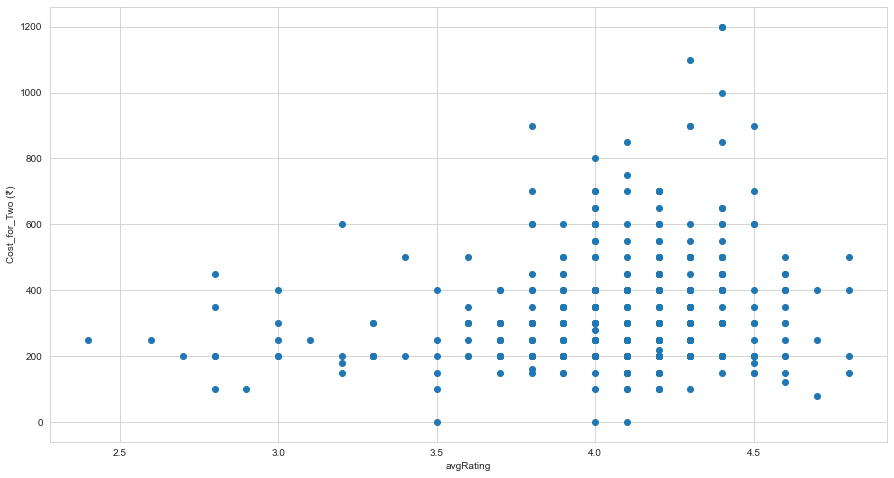

In [67]:
# Create a new dataset with avgRating > 0
df_ahmedabad_filtered = df_ahmedabad[df_ahmedabad['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_ahmedabad_filtered['avgRating'], df_ahmedabad_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [69]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_ahmedabad
for area in df_ahmedabad['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Ahmedabad, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_ahmedabad for the latitude and longitude values
df_ahmedabad['area_latitude'] = df_ahmedabad['area'].map(dict(zip(df_ahmedabad['area'].unique(), latitude)))
df_ahmedabad['area_longitude'] = df_ahmedabad['area'].map(dict(zip(df_ahmedabad['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_ahmedabad.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3440267542.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3440267542.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3440267542.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

In [71]:
ahmedabad_latitude = 23.0225
ahmedabad_longitude = 72.5714

map_ahmedabad = folium.Map(location=[ahmedabad_latitude, ahmedabad_longitude], zoom_start=11)

for lat, lng, name in zip(df_ahmedabad['area_latitude'], df_ahmedabad['area_longitude'], df_ahmedabad['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_ahmedabad)

map_ahmedabad

In [70]:
import folium

ahmedabad_latitude = 23.0225
ahmedabad_longitude = 72.5714
map_ahmedabad = folium.Map(location=[ahmedabad_latitude, ahmedabad_longitude], zoom_start=11)

area_count = df_ahmedabad.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_ahmedabad)

map_ahmedabad

### Analysis of Restaurants in Delhi

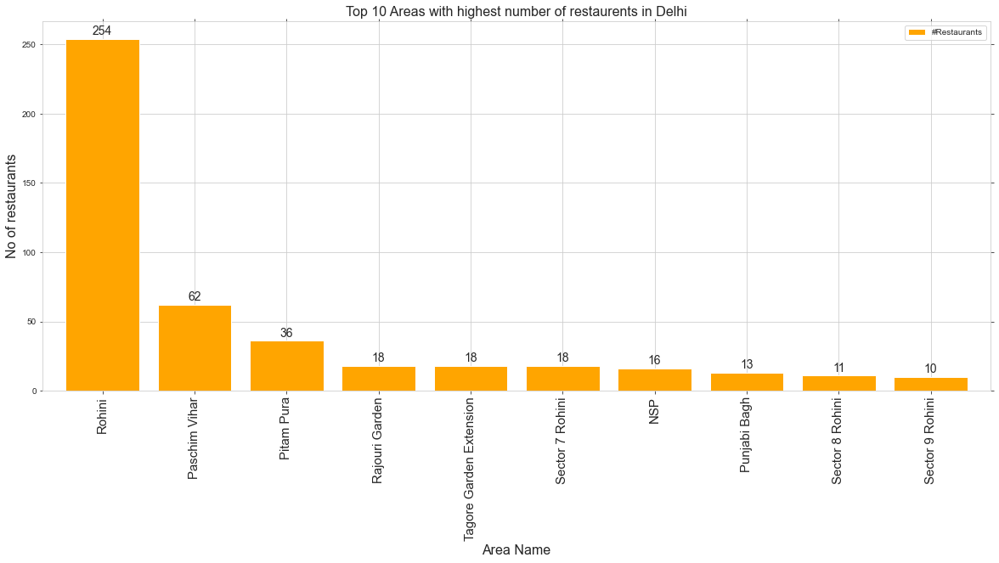

In [72]:
# filter dataframe for Delhi city
df_delhi = df[df['city'] == 'Delhi']

histo = df_delhi['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Delhi', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

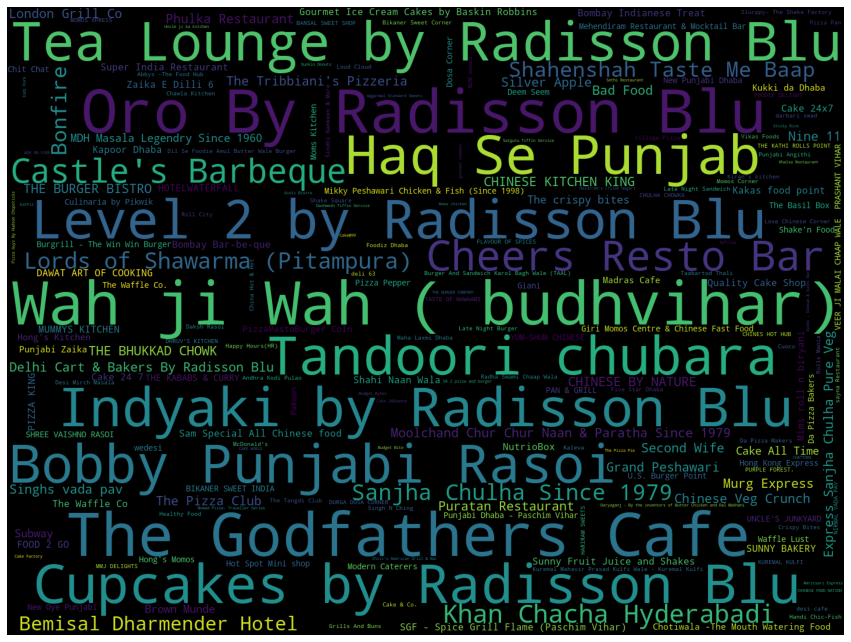

In [34]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_delhi['name'].value_counts()))
fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [73]:
df_delhi['cuisines'] = df_delhi['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_12416\1313434351.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



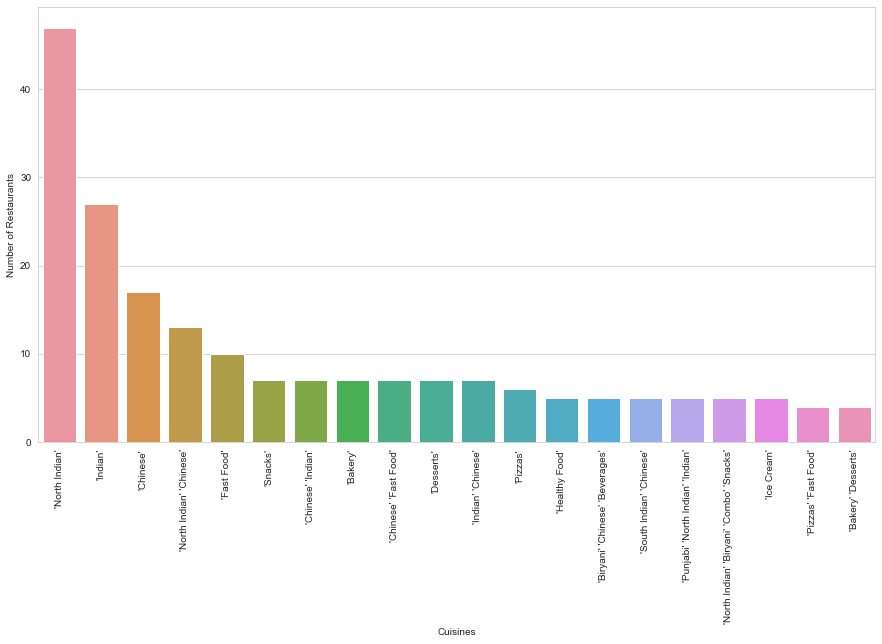

In [74]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_delhi.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

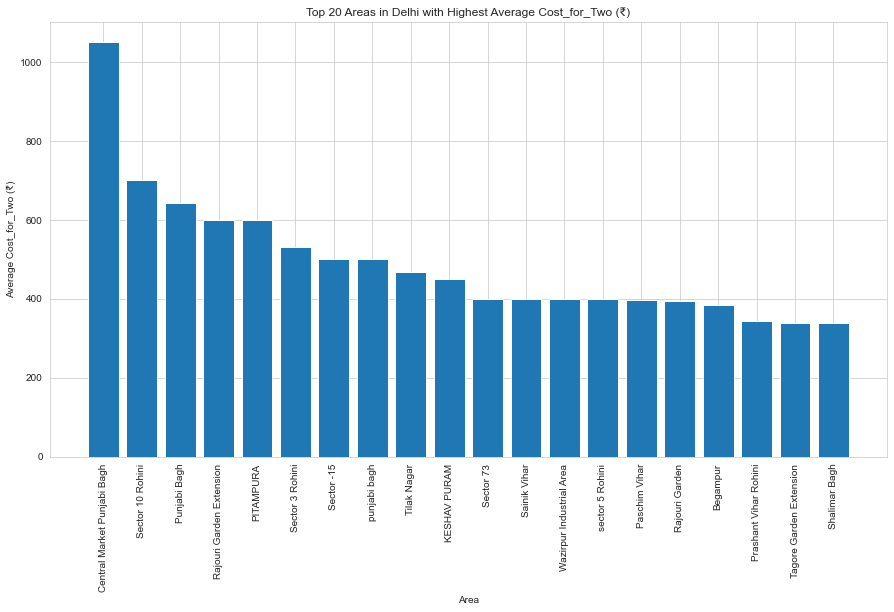

In [93]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_delhi.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Delhi with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

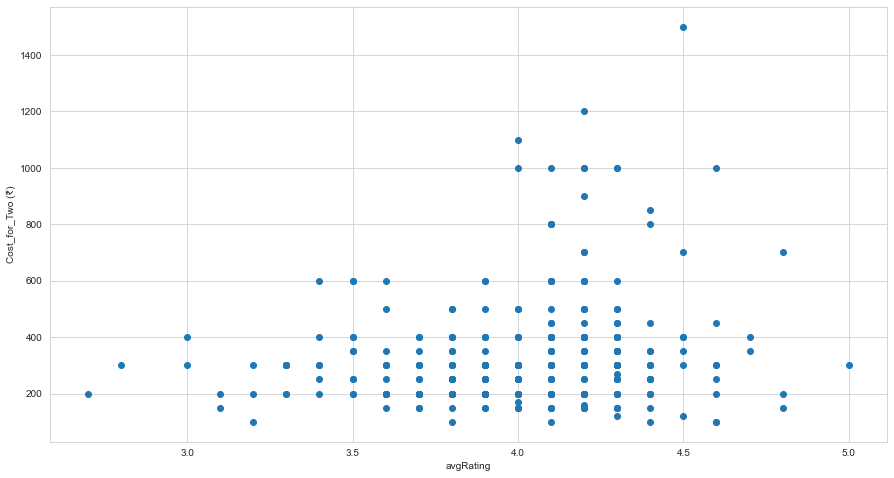

In [76]:
# Create a new dataset with avgRating > 0
df_delhi_filtered = df_delhi[df_delhi['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_delhi_filtered['avgRating'], df_delhi_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [77]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_delhi
for area in df_delhi['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Delhi, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_delhi for the latitude and longitude values
df_delhi['area_latitude'] = df_delhi['area'].map(dict(zip(df_delhi['area'].unique(), latitude)))
df_delhi['area_longitude'] = df_delhi['area'].map(dict(zip(df_delhi['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_delhi.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_12416\547869923.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\547869923.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\547869923.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

In [78]:
delhi_latitude = 28.7041
delhi_longitude = 77.1025

map_delhi = folium.Map(location=[delhi_latitude, delhi_longitude], zoom_start=11)

for lat, lng, name in zip(df_delhi['area_latitude'], df_delhi['area_longitude'], df_delhi['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_delhi)

map_delhi

In [79]:
delhi_latitude = 28.7041
delhi_longitude = 77.1025
map_delhi = folium.Map(location=[delhi_latitude, delhi_longitude], zoom_start=11)

area_count = df_delhi.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_delhi)

map_delhi

### Analysis of Restaurants in Surat

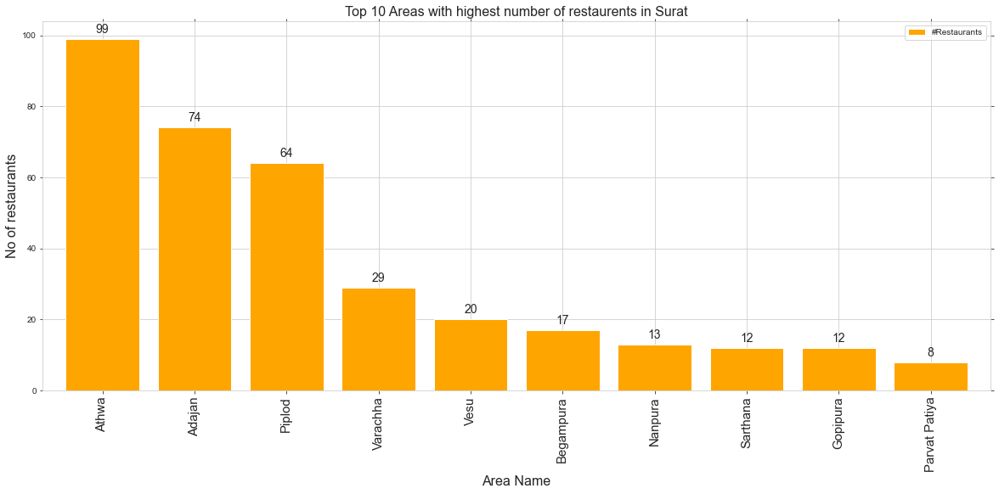

In [80]:
# filter dataframe for Surat city
df_surat = df[df['city'] == 'Surat']

histo = df_surat['area'].value_counts().nlargest(10)

ax = histo.plot(kind='bar', figsize=(20, 8), rot=90, width = 0.8, color=['orange'])

rects = ax.patches
labels = list(histo)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height + 1, label, ha='center', va='bottom', fontsize=14)

ax.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')
ax.xaxis.set_tick_params(labelsize=15)

ax.legend(fontsize=14)
ax.set_title('Top 10 Areas with highest number of restaurents in Surat', fontsize=16)
ax.set_ylabel('No of restaurants', fontsize=16)
ax.set_xlabel('Area Name', fontsize=16)
ax.legend(['#Restaurants'])

ax.set_facecolor("white")

plt.show()

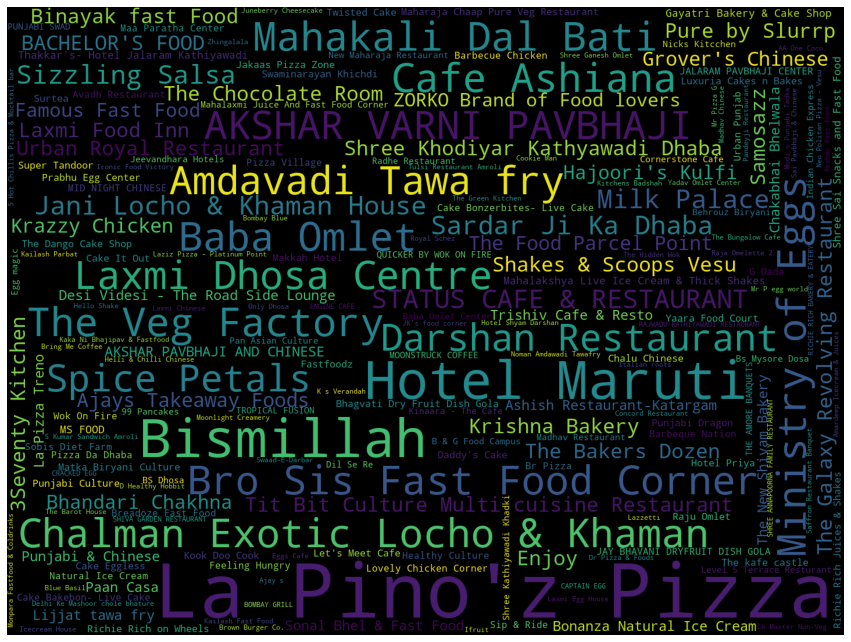

In [37]:
wordcloud = (WordCloud(width=1440, height=1080, relative_scaling=0.5).generate_from_frequencies(df_surat['name'].value_counts()))
fig = plt.figure(1,figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [81]:
df_surat['cuisines'] = df_surat['cuisines'].apply(lambda x: x[1:-1])

C:\Users\user\AppData\Local\Temp\ipykernel_12416\2047712277.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



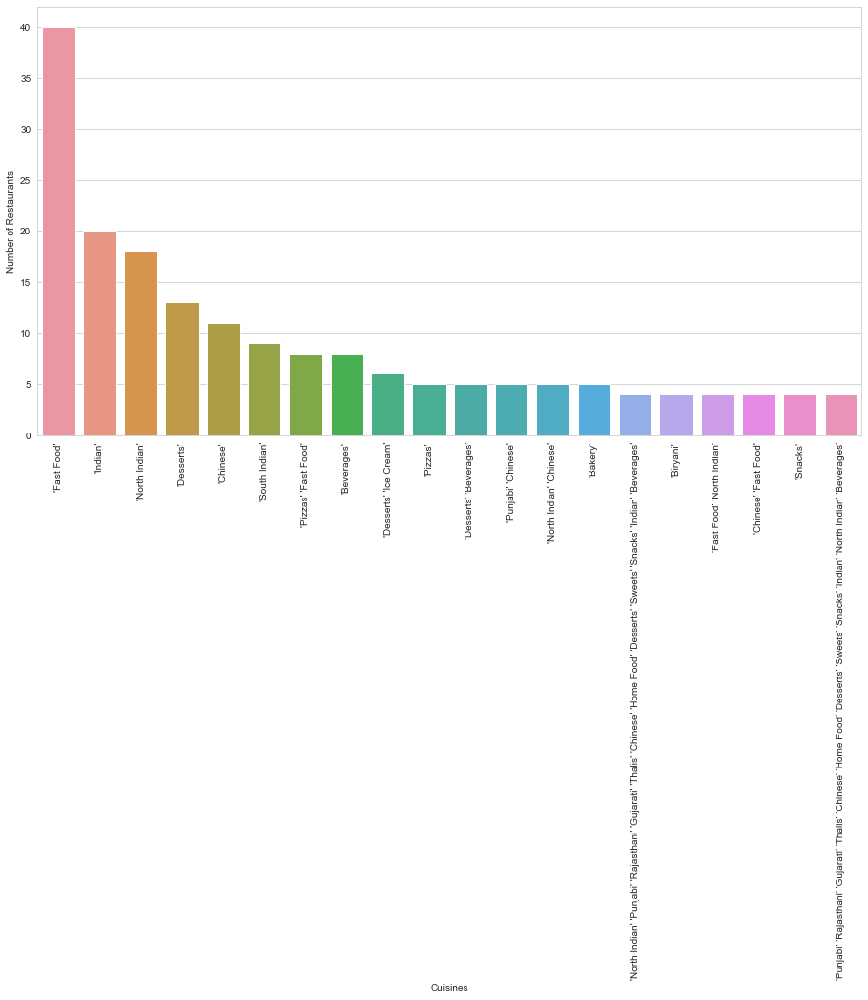

In [82]:
# Group the dataset by cuisines and count the number of restaurants
grouped = df_surat.groupby('cuisines').size().reset_index(name='counts')

# Sort the values in descending order
grouped = grouped.sort_values(by='counts', ascending=False).head(20)

# Plot the bar chart
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(x='cuisines', y='counts', data=grouped, ax=ax)
ax.set_xlabel('Cuisines')
ax.set_ylabel('Number of Restaurants')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

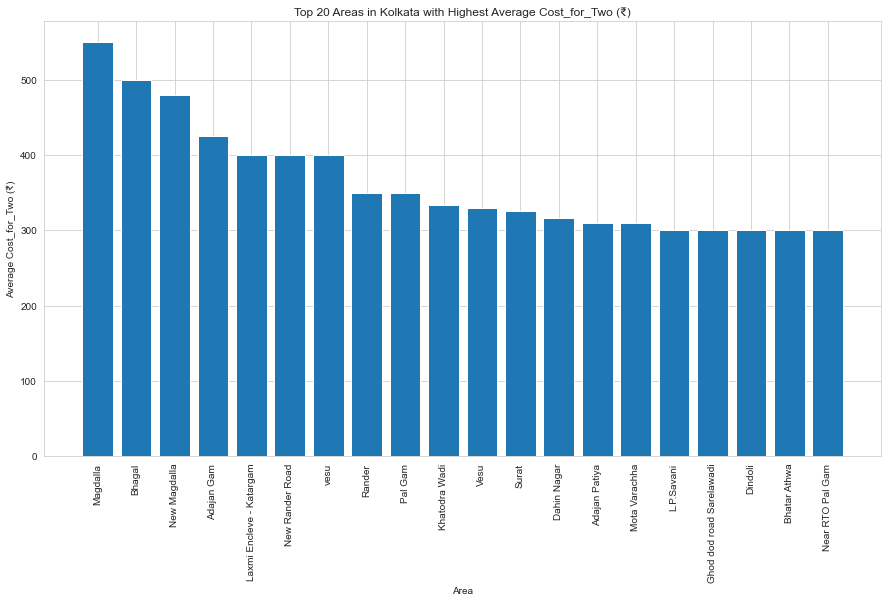

In [83]:
# Group the dataset by area and calculate the mean Cost_for_Two (₹)
grouped = df_surat.groupby('area')['Cost_for_Two (₹)'].mean().reset_index()

# Sort the data by average Cost_for_Two (₹)
grouped = grouped.sort_values(by='Cost_for_Two (₹)', ascending=False)

# Plot the bar chart for the top 20 areas
fig, ax = plt.subplots(figsize=(15,8))
plt.bar(grouped['area'][:20], grouped['Cost_for_Two (₹)'][:20])
plt.xlabel('Area')
plt.ylabel('Average Cost_for_Two (₹)')
plt.title('Top 20 Areas in Surat with Highest Average Cost_for_Two (₹)')
plt.xticks(rotation=90)
plt.show()

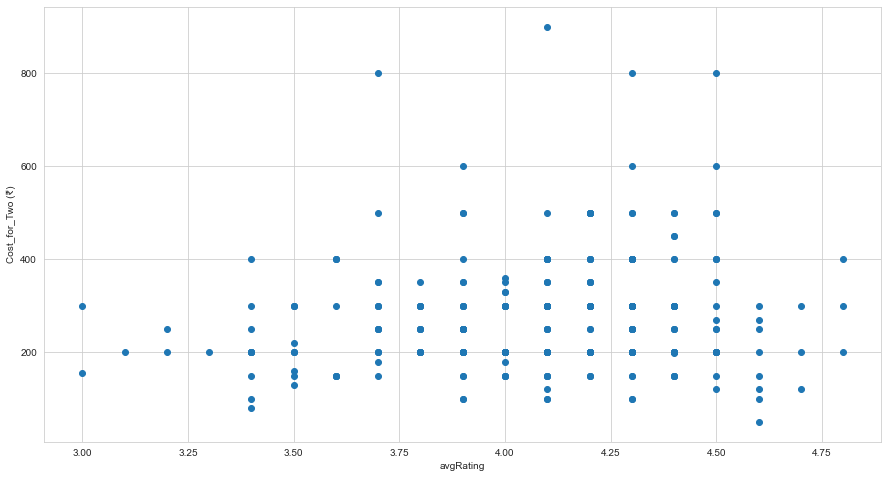

In [84]:
# Create a new dataset with avgRating > 0
df_surat_filtered = df_surat[df_surat['avgRating'] > 0]


# Plot the scatter plot
fig, ax = plt.subplots(figsize=(15,8))
plt.scatter(df_surat_filtered['avgRating'], df_surat_filtered['Cost_for_Two (₹)'])
plt.xlabel('avgRating')
plt.ylabel('Cost_for_Two (₹)')
plt.show()

In [86]:
#create empty lists to store the latitude and longitude values
latitude = []
longitude = []

#iterate through the unique area names in df_surat
for area in df_surat['area'].unique():
    #use geopy library to get the coordinates for the area
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(area + ', Surat, India')
    if location:
    # if location is found, append the latitude and longitude values to the lists
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
    # if location is not found, append None to the lists
        latitude.append(None)
        longitude.append(None)
#create new columns in df_surat for the latitude and longitude values
df_surat['area_latitude'] = df_surat['area'].map(dict(zip(df_surat['area'].unique(), latitude)))
df_surat['area_longitude'] = df_surat['area'].map(dict(zip(df_surat['area'].unique(), longitude)))

#drop rows with missing latitude and longitude values
df_surat.dropna(subset=['area_latitude', 'area_longitude'], inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3676977320.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3676977320.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_12416\3676977320.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

In [87]:
surat_latitude = 21.1702
surat_longitude = 72.8311

map_surat = folium.Map(location=[surat_latitude, surat_longitude], zoom_start=11)

for lat, lng, name in zip(df_surat['area_latitude'], df_surat['area_longitude'], df_surat['name']):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_surat)

map_surat

In [88]:
surat_latitude = 21.1702
surat_longitude = 72.8311
map_surat = folium.Map(location=[surat_latitude, surat_longitude], zoom_start=11)

area_count = df_surat.groupby(['area_latitude', 'area_longitude']).size().reset_index(name='counts')
folium.plugins.HeatMap(data=area_count[['area_latitude', 'area_longitude', 'counts']].values.tolist(), overlay=True, name = 'restaurant density',radius = 20).add_to(map_surat)

map_surat